# Comparing different datasets, sample level, NK cells

- CLR normalized protein data is used in comparisons of surface markers between different datasets in this notebook
- focusing on NK cells 
- Also cell numbers of different samples are visualized

### Markers selected according to these references #
- Mustjoki group (R-code + other information)
- Pfefferle, A. et al.  (2019). A Temporal Transcriptional Map of Human Natural Killer Cell Differentiation. BioRxiv, 630657. https://doi.org/10.1101/630657
- Melsen, J. et al. (2022). Single-cell transcriptomics in bone marrow delineates CD56dimGranzymeK+ subset as intermediate stage in NK cell differentiation. Frontiers in immunology, 13, 1044398. https://doi.org/10.3389/fimmu.2022.1044398
- Yang, C. et al.(2019). Heterogeneity of human bone marrow and blood natural killer cells defined by single-cell transcriptome. Nature communications, 10(1), 3931. https://doi.org/10.1038/s41467-019-11947-7

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scvi
import scanpy as sc
import umap

from ridgeplot import ridgeplot

import warnings

warnings.filterwarnings('ignore')



Global seed set to 0
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


## File preparations

### Neurips

In [2]:
#Neurips

adata_neurips = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm.h5ad')

In [3]:
adata_neurips.obs['new_cell_type'].unique()

['NK', 'T', 'Prog', 'Myel', 'B', 'DC', 'E', 'Normoblast']
Categories (8, object): ['B', 'DC', 'E', 'Myel', 'NK', 'Normoblast', 'Prog', 'T']

In [4]:
#Select only NK cells

neurips_nk=adata_neurips[adata_neurips.obs['new_cell_type'] == 'NK' ]

In [5]:
neurips_nk

View of AnnData object with n_obs × n_vars = 7388 × 8051
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group'
    uns: 'neighbors', 'new_cell_type_colors', 'umap'
    obsm: 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    obsp: 'connectivities', 'distances'

In [6]:
neurips_nk_prot=neurips_nk.obsm['protein_expression_clr_neurips']

In [7]:
#To exclude columns that contain only zeros

neurips_nk_prot = pd.DataFrame(neurips_nk_prot)
neurips_nk_prot != 0
(neurips_nk_prot != 0).any(axis=0)
neurips_nk_prot.loc[:, (neurips_nk_prot != 0).any(axis=0)]
neurips_nk_prot = neurips_nk_prot.loc[:, (neurips_nk_prot != 0).any(axis=0)]


### Granja

In [9]:
adata_granja = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_granja_norm.h5ad')

In [10]:
adata_granja.obs['cell_type'].unique().to_list()

['CD4+ T 1',
 'CD14+ monocyte 1',
 'Pre B',
 'Pro B',
 'CD8+ T',
 'Promonocyte',
 'CD14+ monocyte 2',
 'Plasmacytoid dendritic cell',
 'NK T 2',
 'Immature B',
 'Late erythoid precursor 1',
 'Pre B (cycling)',
 'NK',
 'Late erythoid precursor 3',
 'Early erythoid precursor',
 'CD16+ monocyte',
 'Conventional dendritic cell',
 'HSC',
 'NK T 1',
 'Late erythoid precursor 2',
 'Plasma B cell',
 'Stromal cell',
 'Megakaryocyte',
 nan]

In [11]:
#Select NK cells
granja_nk=adata_granja[adata_granja.obs['new_cell_type'] == 'NK' ]

In [12]:
granja_nk

View of AnnData object with n_obs × n_vars = 1033 × 8051
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group'
    uns: 'neighbors', 'new_cell_type_colors', 'umap'
    obsm: 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_granja'
    obsp: 'connectivities', 'distances'

In [13]:
granja_nk_prot=granja_nk.obsm['protein_expression_clr_granja']

In [14]:
#To exclude columns that contain only zeros

granja_nk_prot = pd.DataFrame(granja_nk_prot)
granja_nk_prot != 0
(granja_nk_prot != 0).any(axis=0)
granja_nk_prot.loc[:, (granja_nk_prot != 0).any(axis=0)]
granja_nk_prot = granja_nk_prot.loc[:, (granja_nk_prot != 0).any(axis=0)]


### Easigenomics

### Comments:

- Only NKT annotation available (NK- + T-cells)

In [15]:
adata_easi = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_easi_norm.h5ad')

In [16]:
adata_easi.obs['cell_type'].unique().to_list()

['NKT',
 'non-leukemic',
 'preleukemic',
 'non-leukemic?',
 nan,
 'leukemic',
 'leukemic?',
 'doublets?',
 'unknown',
 '0',
 'preleukemic?']

In [17]:
#Select NK + T

easi_nkt=adata_easi[adata_easi.obs['cell_type'] == 'NKT' ]

In [18]:
easi_nkt_prot=easi_nkt.obsm['protein_expression_clr']


In [19]:
#To exclude columns that contain only zeros

easi_nkt_prot = pd.DataFrame(easi_nkt_prot)
easi_nkt_prot != 0
(easi_nkt_prot != 0).any(axis=0)
easi_nkt_prot.loc[:, (easi_nkt_prot != 0).any(axis=0)]
easi_nkt_prot = easi_nkt_prot.loc[:, (easi_nkt_prot != 0).any(axis=0)]

for col in easi_nkt_prot:
    print(col)

CD19
CD10
CD20
CD3
CD2
CD11b
HLADR
CD38
CD11c
CD7
CD45
CD33
CD81
CD73
CD123
CD14
CD45RA
CD45RO
CD4
CD8a
CD197
CD127
CD56
CD5
CD15
CD64
CD117
CD24
CD44
CD58
CD66ace
CD13
CD34


### Seurat 

In [20]:
#Seurat

adata_seurat = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_seurat_norm.h5ad')

In [21]:
adata_seurat.obs['cell_type'].unique().to_list()

['Prog_RBC',
 'gdT',
 'CD4 Naive',
 'CD4 Memory',
 'CD14 Mono',
 'Naive B',
 'CD8 Naive',
 'Treg',
 'CD8 Effector_2',
 'NK',
 'GMP',
 'CD8 Effector_1',
 'CD16 Mono',
 'pDC',
 'CD8 Memory_1',
 'MAIT',
 'Memory B',
 'cDC2',
 'CD56 bright NK',
 'Prog_B 2',
 'Prog_Mk',
 'CD8 Memory_2',
 'Plasmablast',
 'HSC',
 'LMPP',
 'Prog_DC',
 'Prog_B 1']

In [22]:
#Select NK-cells

seurat_nk=adata_seurat[adata_seurat.obs['new_cell_type'] == 'NK' ]

In [24]:
seurat_nk_prot=seurat_nk.obsm['protein_expression_clr_seurat']


In [25]:
#To exclude columns that contain only zeros

seurat_nk_prot = pd.DataFrame(seurat_nk_prot)
seurat_nk_prot != 0
(seurat_nk_prot != 0).any(axis=0)
seurat_nk_prot.loc[:, (seurat_nk_prot != 0).any(axis=0)]
seurat_nk_prot = seurat_nk_prot.loc[:, (seurat_nk_prot != 0).any(axis=0)]


## Comparisons

In [8]:
nk_all = ['CD5',
 'CD52',
 'CD160',
 'CD226',
 'CD56',
 'CD2',
 'CD27',
 'CD158b',
 'CD127',
 'CD122',
 'CD38',
 'CD34',
 'CD161',
 'CD314',
 'TIGIT',
 'CD57',
 'CD195',
 'CD155',
 'CD335',
 'CD44',
 'CD7',
 'CD69',
 'CD94',
 'CD16',
 'CD62L']

In [9]:
#Used to check which markers were used in Neurips

listOfmarkers= nk_all

nk_all= []

for x in listOfmarkers:
    if x in neurips_nk_prot.columns:
        print(x, "Yes")
        nk_all.append(x)
    else:
        print(x, "No") 

CD5 Yes
CD52 Yes
CD160 No
CD226 Yes
CD56 Yes
CD2 Yes
CD27 Yes
CD158b Yes
CD127 Yes
CD122 Yes
CD38 Yes
CD34 No
CD161 Yes
CD314 Yes
TIGIT Yes
CD57 Yes
CD195 Yes
CD155 Yes
CD335 Yes
CD44 Yes
CD7 Yes
CD69 Yes
CD94 Yes
CD16 Yes
CD62L Yes


### Neurips

In [10]:
samples=adata_neurips.obs['POOL'].unique().tolist()

In [11]:
#save means of protein counts/each protein/each sample into a list

list_samples= []

for sample in samples:
    eg=adata_neurips[adata_neurips.obs['new_cell_type'] == 'NK']
    eg=adata_neurips[adata_neurips.obs['POOL'] == sample]
    prot=eg.obsm['protein_expression_clr_neurips']
    prot_mean=prot.mean(axis=0).sort_values()
    list_samples.append(prot_mean)

    

In [12]:
#Count total cell numbers + NK cell numbers

all_cells_neurips=[]
nk_cell_neurips=[]

for sample in samples:
    all_cells_neurips.append(len(adata_neurips[adata_neurips.obs['POOL'] == sample]))
    nk_cell_neurips.append(len(neurips_nk[neurips_nk.obs['POOL'] == sample]))

print(all_cells_neurips)
print(nk_cell_neurips)
    

[4885, 10316, 4450, 9684, 10802, 4575, 4123, 6565, 3535, 8725, 8478, 4860]
[665, 846, 518, 529, 1198, 151, 202, 730, 262, 1814, 210, 263]


In [16]:
#save column names
proteins=adata_neurips.obsm['protein_expression_clr_neurips'].columns

In [17]:
#creating a dataframe from list of lists

df = pd.DataFrame(list_samples, columns = proteins)


In [18]:
df=df.T

In [19]:
#add column names

df.columns=samples


In [20]:
df=df.T

In [21]:
#remove columns that contain only zeros

df = pd.DataFrame(df)
df != 0
(df != 0).any(axis=0)
df.loc[:, (df != 0).any(axis=0)]
df = df.loc[:, (df != 0).any(axis=0)]

In [22]:
index_sort = df.mean().sort_values().index
df_sorted = df[index_sort]

In [23]:
df_sorted=df_sorted.T

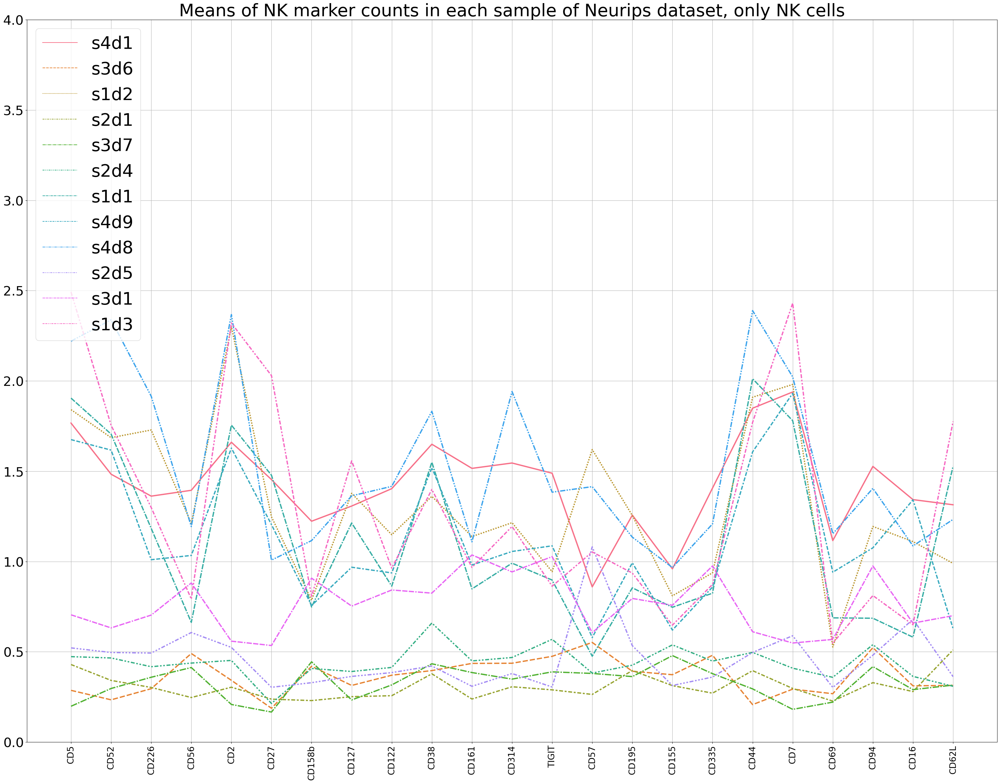

In [24]:
#only NK cells selected from each sample, CLR normalized

palette = sns.color_palette("husl", 12)


plt.figure(figsize=[40,30])
a= sns.lineplot(data=df_sorted.loc[nk_all], palette=palette, linewidth = 3)
a.set_xticklabels(a.get_xticklabels(),rotation=90) 
a.tick_params(axis='x', labelsize=20)
a.tick_params(axis='y', labelsize=30)
plt.ylim(0, 4)
plt.legend(loc='upper left', fontsize = 40, facecolor='white')
plt.grid()
plt.title("Means of NK marker counts in each sample of Neurips dataset, only NK cells", fontsize=40) ;




In [25]:
df_sorted.T

,TCRVd2,CD194,TCRVa7.2,CD42b,CD158e1,CD25,CD1c,CD146,CD103,IgD,...,CD47,HLA-A-B-C,CD44,CD81,CD11a,CD45RA,CD7,CD2,CD45,CD5
s4d1,0.665076,0.958827,0.905964,1.043606,1.091735,1.080279,0.905249,1.049192,1.065979,0.930738,...,1.610546,1.760489,1.848751,1.838738,1.896102,1.483842,1.938531,1.660241,1.684020,1.766428
s3d6,0.158318,0.218237,0.238211,0.295162,0.302102,0.254409,0.218034,0.302837,0.325588,0.120745,...,0.200408,0.228202,0.207254,0.297849,0.288648,0.424696,0.293036,0.341791,0.229554,0.286301
s1d2,0.316631,0.575823,0.445114,0.529079,0.512646,0.595072,0.564102,0.612642,0.648368,0.511047,...,1.822831,1.627263,1.909522,1.787953,2.057640,2.242679,1.980217,2.300188,2.063965,1.840709
s2d1,0.073591,0.268547,0.119025,0.219541,0.182849,0.255392,0.206386,0.186954,0.200278,0.271968,...,0.412130,0.346285,0.395398,0.250911,0.362868,0.396372,0.296759,0.303741,0.374771,0.429235
s3d7,0.137893,0.193026,0.206742,0.272644,0.234811,0.203448,0.226082,0.256404,0.286846,0.122100,...,0.250612,0.293415,0.294397,0.244202,0.399151,0.392966,0.181030,0.208118,0.282711,0.198172
s2d4,0.194087,0.404011,0.214715,0.301287,0.315190,0.280196,0.302109,0.291323,0.333655,0.346982,...,0.539152,0.474773,0.496273,0.458739,0.498955,0.502431,0.408966,0.452069,0.511406,0.472912
s1d1,0.304384,0.672118,0.429427,0.565049,0.497007,0.722347,0.819291,0.625665,0.687057,1.066962,...,1.986176,1.906951,2.011889,1.655031,1.873453,1.820197,1.779618,1.754938,2.035544,1.904649
s4d9,0.323518,0.434092,0.574719,0.498799,0.655788,0.611487,0.668388,0.559020,0.600221,1.148763,...,1.483739,1.671932,1.606962,1.891398,1.387226,1.545636,1.931010,1.627833,1.663338,1.674751
s4d8,0.483149,0.711207,1.562635,0.768313,0.830868,0.803593,0.853610,0.930567,0.928822,1.031492,...,2.338416,2.599331,2.389188,2.770256,2.530337,1.872543,2.021836,2.367131,2.514055,2.219946
s2d5,0.083282,0.304008,0.124636,0.325668,0.347092,0.172981,0.185343,0.184192,0.196218,0.095083,...,0.519450,0.463481,0.496405,0.366651,0.575098,0.595833,0.588660,0.524069,0.576690,0.521419


In [26]:
#saving NK markers from all samples into a list

list_samples=[]

for sample in samples:
    eg=adata_neurips[adata_neurips.obs['new_cell_type'] == 'NK']
    eg=adata_neurips[adata_neurips.obs['POOL'] == sample]
    prot=eg.obsm['protein_expression_clr_neurips']
    prot_marker=prot[nk_all]
    list_samples.append(prot_marker)

In [27]:
#NK markers saved for each sample

s4d1= list_samples[0]
s3d6= list_samples[1]
s1d2= list_samples[2]
s2d1= list_samples[3]
s3d7= list_samples[4]
s2d4= list_samples[5]
s1d1= list_samples[6]
s4d9= list_samples[7]
s4d8= list_samples[8]
s2d5= list_samples[9]
s3d1= list_samples[10]
s1d3= list_samples[11]


In [28]:
s4d1["Sample"] = "s4d1"
s3d6["Sample"] = "s3d6"
s1d2["Sample"] = "s1d2"
s2d1["Sample"] = "s2d1"
s3d7["Sample"] = "s3d7"
s2d4["Sample"] = "s2d4"
s1d1["Sample"] = "s1d1"
s4d9["Sample"] = "s4d9"
s4d8["Sample"] = "s4d8"
s2d5["Sample"] = "s2d5"
s3d1["Sample"] = "s3d1"
s1d3["Sample"] = "s1d3"

In [29]:
df_all=pd.concat([s4d1,s3d6,s1d2,s2d1,s3d7,s2d4,s1d1,s4d9,s4d8,s2d5,s3d1,s1d3])


In [30]:
df_all = df_all.T.drop_duplicates().T

In [31]:
df_all.columns

Index(['CD5', 'CD52', 'CD226', 'CD56', 'CD2', 'CD27', 'CD158b', 'CD127',
       'CD122', 'CD38', 'CD161', 'CD314', 'TIGIT', 'CD57', 'CD195', 'CD155',
       'CD335', 'CD44', 'CD7', 'CD69', 'CD94', 'CD16', 'CD62L', 'Sample'],
      dtype='object')

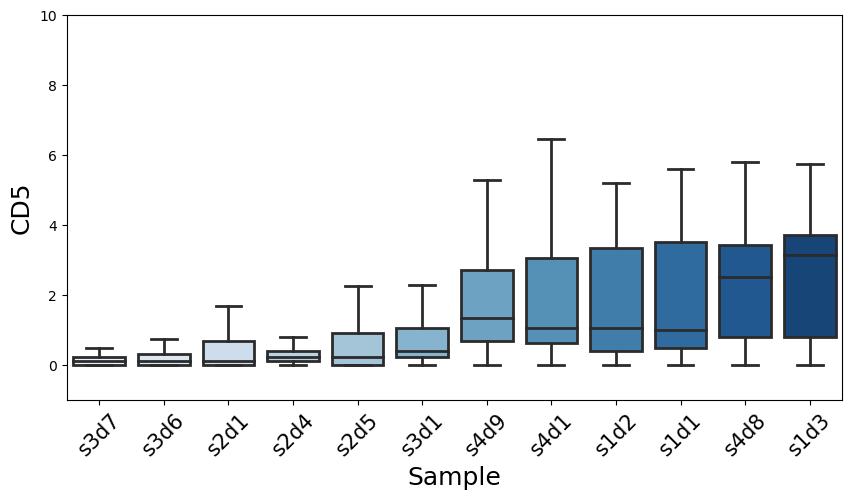

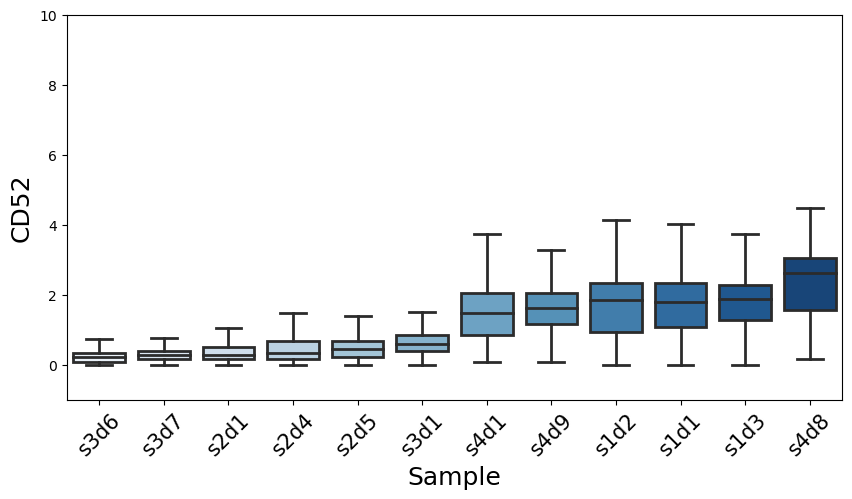

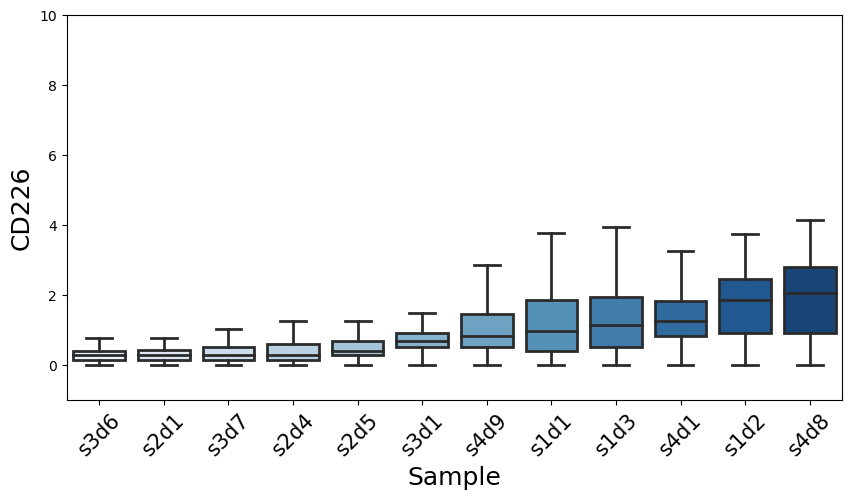

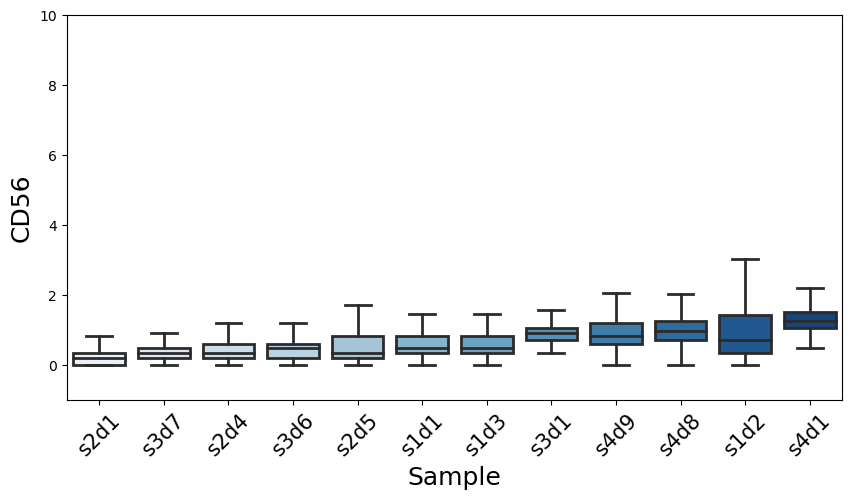

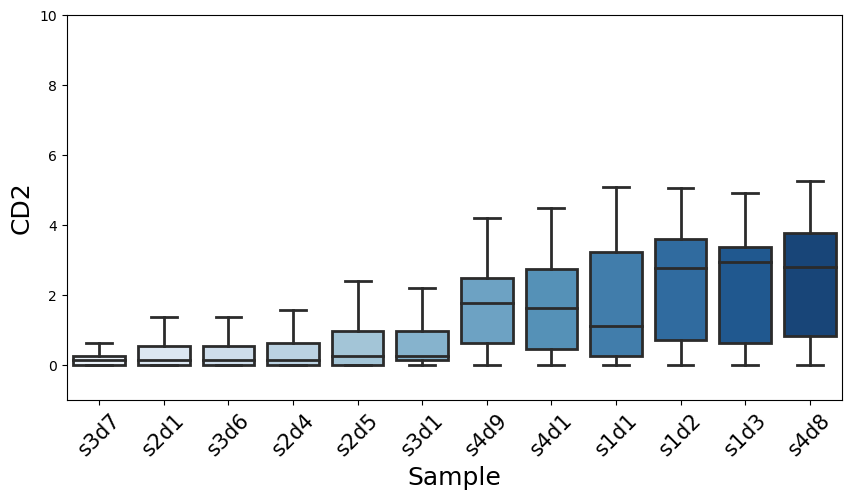

...

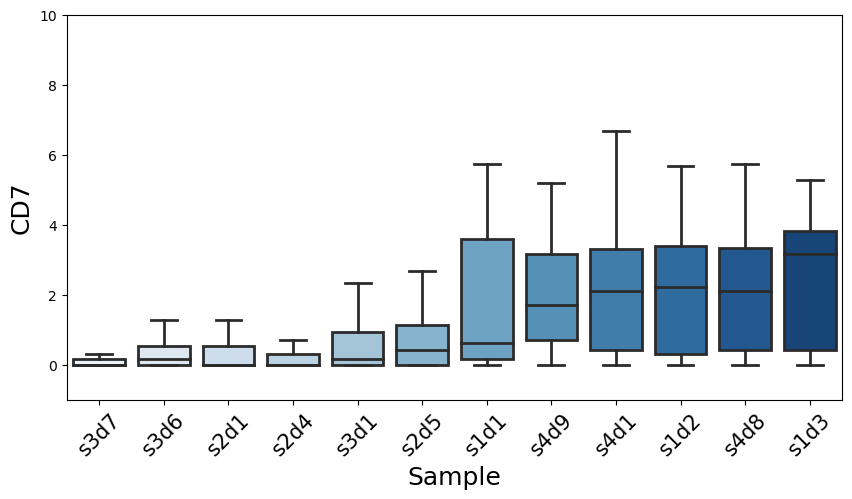

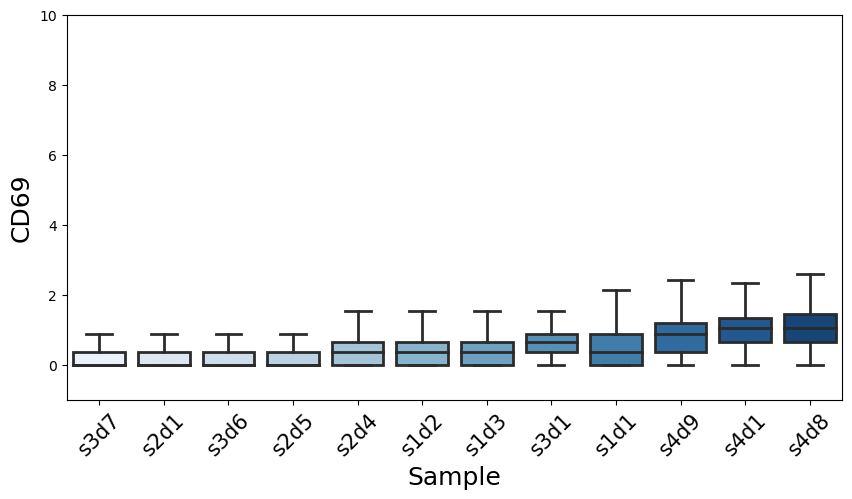

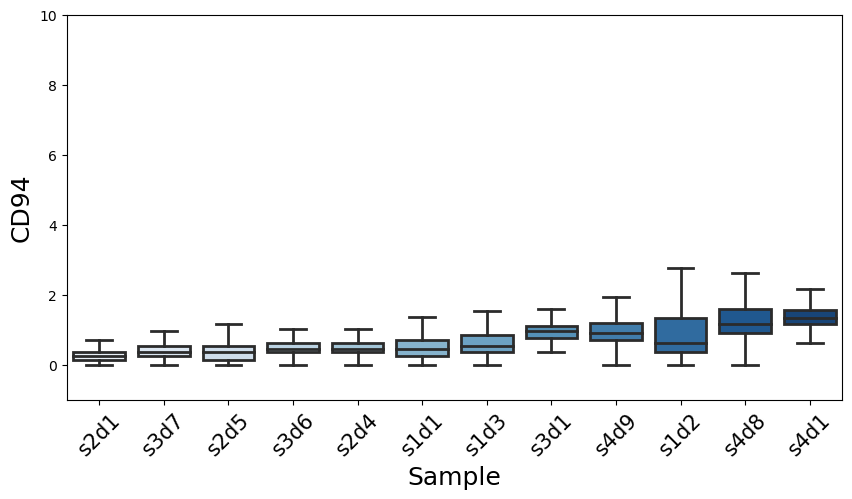

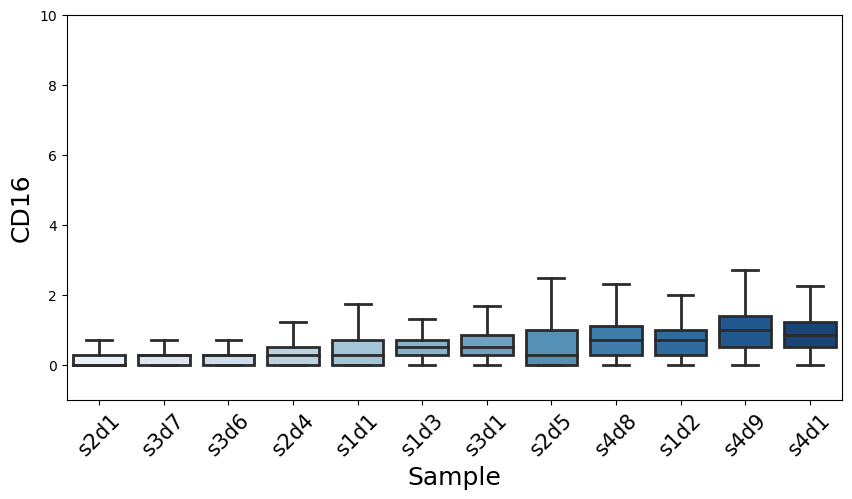

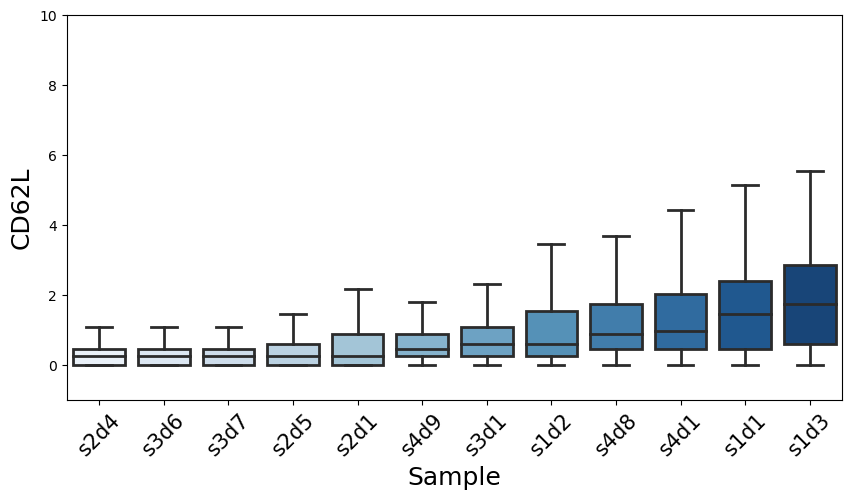

In [32]:
# All markers

for marker in nk_all:
    plt.figure(figsize=[10,5])
    plt.ylim(-1, 10)
    by_counts = df_all.groupby(['Sample'])[marker].mean().sort_values(ascending=True)
    b=sns.boxplot(data=df_all,x="Sample", y=marker, order=by_counts.index, fliersize=0, palette="Blues", linewidth=2)
    b.set_xticklabels(b.get_xticklabels(),rotation=45) 
    b.tick_params(axis='x', labelsize=15)
    plt.xlabel('Sample', fontsize=18)
    plt.ylabel(marker, fontsize=18);

In [33]:

data= df_sorted[['s4d1', 's4d9', 's4d8']].T
data2 = df_sorted[['s3d6', 's3d1', 's3d7']].T
data3 = df_sorted[['s1d2', 's1d1', 's1d3']].T
data4 = df_sorted[['s2d1', 's2d5', 's2d4']].T

In [34]:
data= data[nk_all]
data2 = data2[nk_all]
data3 = data3[nk_all]
data4 = data4[nk_all]

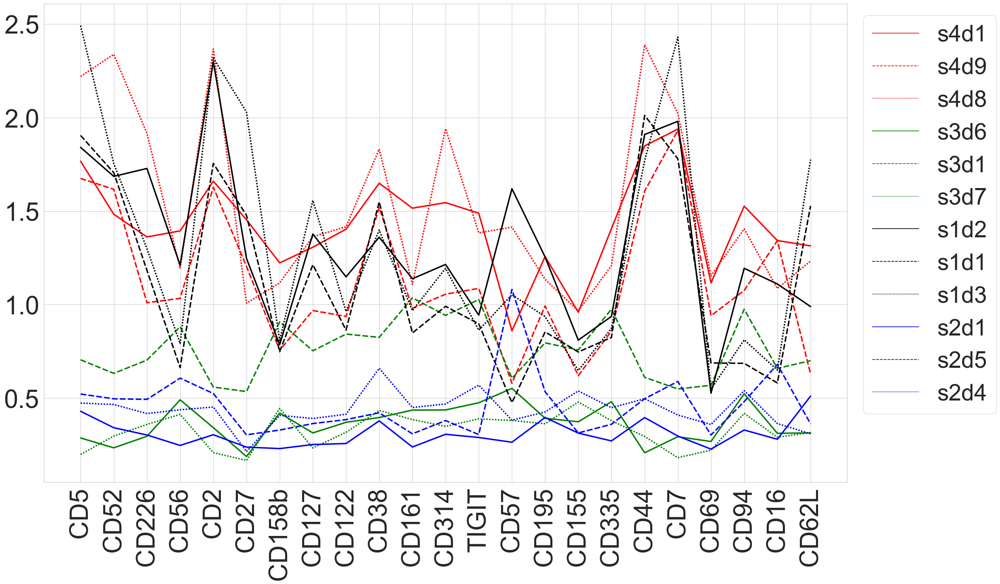

In [59]:
sns.set(style='whitegrid')
sns.set_context("paper", font_scale=5)  

plt.figure(figsize=[25,15]) ;

sns_plot = sns.lineplot(data=data.T, palette=['red'], linewidth=2.5)
sns_plot = sns.lineplot(data=data2.T, palette=['green'], linewidth=2.5)
sns_plot = sns.lineplot(data=data3.T,palette=['black'],linewidth=2.5)
sns_plot = sns.lineplot(data=data4.T,palette=['blue'],linewidth=2.5)

plt.xticks(rotation=90) 

# Plot formatting
plt.legend(prop={'size': 40}, loc='upper right', bbox_to_anchor=(1.2, 1))


### Granja

In [75]:
samples_g=adata_granja.obs['POOL'].unique().tolist()
samples_g

['GSM4138872', 'GSM4138873', 'GSM4138874', 'GSM4138880', 'GSM4138885']

In [76]:
#save means of protein counts/each protein/each sample into a list

list_samples_g= []

for sample in samples_g:
    eg=adata_granja[adata_granja.obs['new_cell_type'] == 'NK']
    eg=adata_granja[adata_granja.obs['POOL'] == sample]
    prot=eg.obsm['protein_expression_clr_granja']
    prot_mean=prot.mean(axis=0).sort_values()
    list_samples_g.append(prot_mean)

In [78]:
all_cells_granja=[]
nk_cell_granja=[]

for sample in samples_g:
    all_cells_granja.append(len(adata_granja[adata_granja.obs['POOL'] == sample]))
    nk_cell_granja.append(len(granja_nk[granja_nk.obs['POOL'] == sample]))

print(all_cells_granja)
print(nk_cell_granja)

[6194, 6247, 1856, 5812, 4095]
[517, 516, 0, 0, 0]


In [79]:
#save column names
proteins=adata_granja.obsm['protein_expression_clr_granja'].columns

In [85]:
#creating a dataframe from list of lists

df_g= pd.DataFrame(list_samples_g, columns = proteins)

df_g

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15,CD117,CD66ace
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,2.009149,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,2.154709,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,3.957347,1.742136,1.433383,0.000000,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,4.028166,0.907976,1.124592,0.000000,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.792122,0.039939,0.033877,0.000000,0.0,0.0


In [86]:
df_g=df_g.T

In [87]:
#add column names

df_g.columns=samples_g


In [88]:
df_g=df_g.T

In [89]:
#remove columns that contain only zeros

df_g = pd.DataFrame(df_g)
df_g != 0
(df_g != 0).any(axis=0)
df_g.loc[:, (df_g != 0).any(axis=0)]
df_g = df_g.loc[:, (df_g != 0).any(axis=0)]


In [90]:
index_sort = df_g.mean().sort_values().index
df_sorted_g = df_g[index_sort]

In [91]:
df_sorted_g=df_sorted_g.T

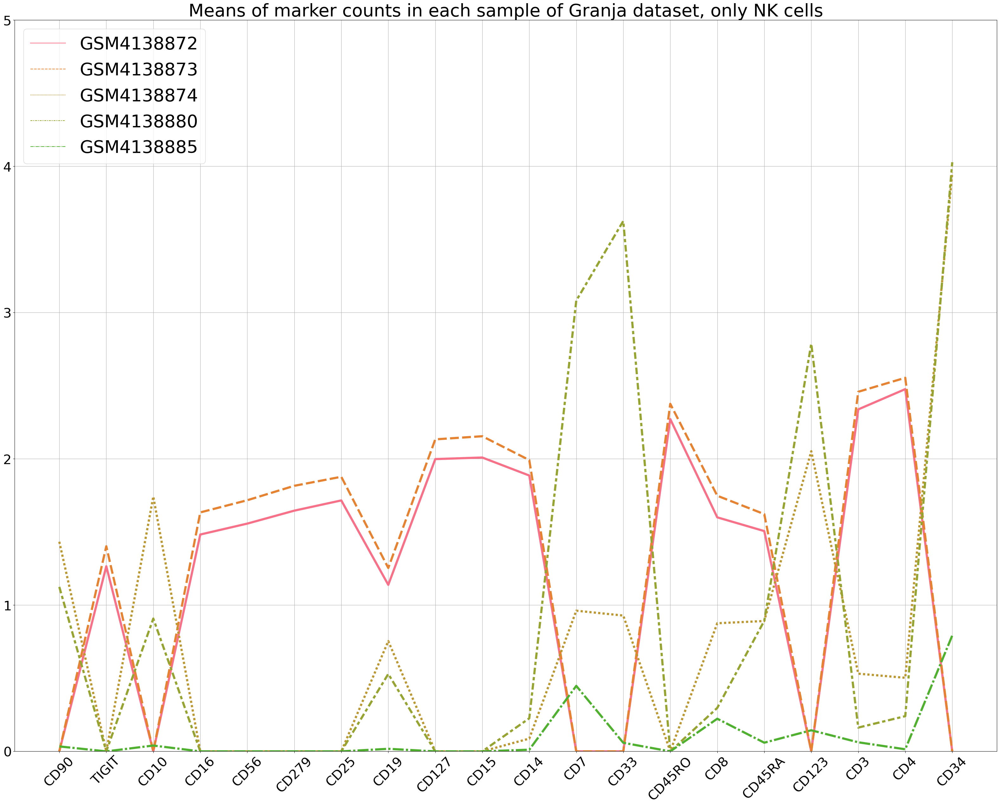

In [92]:
#Only NK cells from each sample selected, CLR normalized

palette = sns.color_palette("husl", 12)


plt.figure(figsize=[40,30])
a= sns.lineplot(data=df_sorted_g, palette=palette, linewidth = 5)
a.set_xticklabels(a.get_xticklabels(),rotation=45) 
a.tick_params(axis='x', labelsize=30)
a.tick_params(axis='y', labelsize=30)
plt.ylim(0, 5)
plt.legend(loc='upper left', fontsize = 40, facecolor='white')
plt.grid()
plt.title("Means of marker counts in each sample of Granja dataset, only NK cells", fontsize=40) ;




In [93]:
df_sorted_g=df_sorted_g.T

In [94]:
df_sorted_g.columns

Index(['CD90', 'TIGIT', 'CD10', 'CD16', 'CD56', 'CD279', 'CD25', 'CD19',
       'CD127', 'CD15', 'CD14', 'CD7', 'CD33', 'CD45RO', 'CD8', 'CD45RA',
       'CD123', 'CD3', 'CD4', 'CD34'],
      dtype='object')

In [95]:
#Used to check which markers were used in Granja

listOfmarkers= nk_all

nk_granja= []

for x in listOfmarkers:
    if x in df_sorted_g.columns:
        print(x, "Yes")
        nk_granja.append(x)
    else:
        print(x, "No") 
        
print(nk_granja)



CD5 No
CD52 No
CD226 No
CD56 Yes
CD2 No
CD27 No
CD158b No
CD127 Yes
CD122 No
CD38 No
CD161 No
CD314 No
TIGIT Yes
CD57 No
CD195 No
CD155 No
CD335 No
CD44 No
CD7 Yes
CD69 No
CD94 No
CD16 Yes
CD62L No
['CD56', 'CD127', 'TIGIT', 'CD7', 'CD16']


In [104]:
nk_granja

['CD56', 'CD127', 'TIGIT', 'CD7', 'CD16']

In [116]:
df_sorted_g = df_sorted_g.T

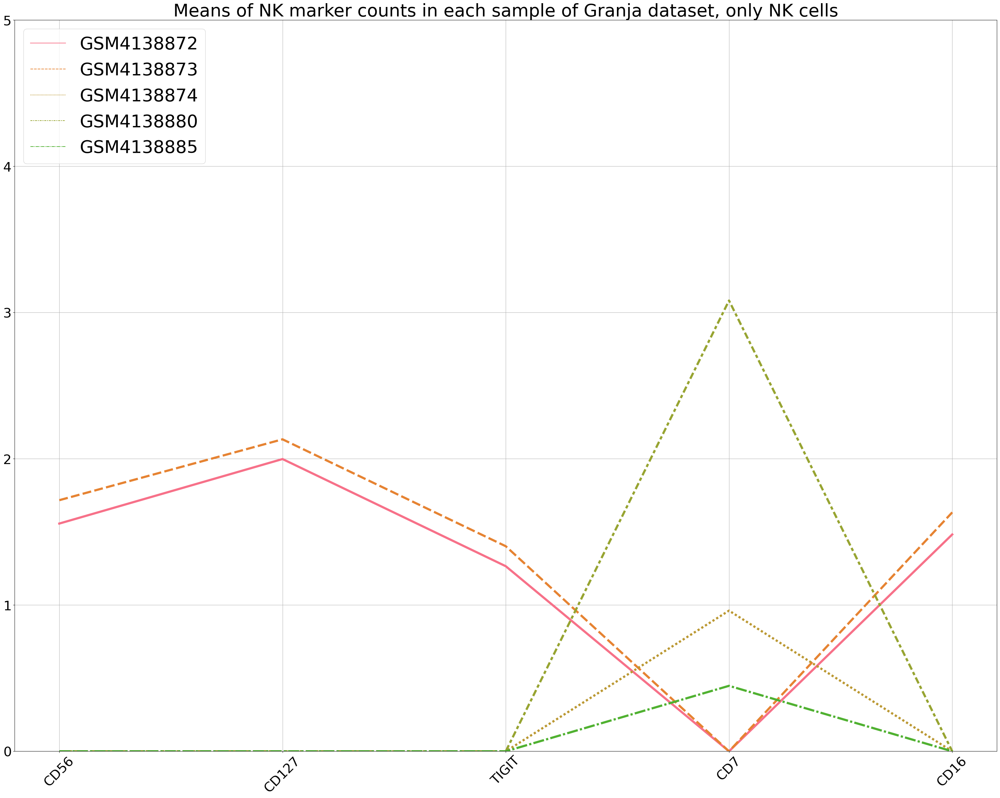

In [117]:
#Only NK cells from each sample selected, CLR normalized

palette = sns.color_palette("husl", 12)

plt.figure(figsize=[40,30])
a= sns.lineplot(data=df_sorted_g.loc[nk_granja], palette=palette, linewidth = 5)
a.set_xticklabels(a.get_xticklabels(),rotation=45) 
a.tick_params(axis='x', labelsize=30)
a.tick_params(axis='y', labelsize=30)
plt.ylim(0, 5)
plt.legend(loc='upper left', fontsize = 40, facecolor='white')
plt.grid()
plt.title("Means of NK marker counts in each sample of Granja dataset, only NK cells", fontsize=40) ;




In [105]:
#All cell types included

#save means of protein counts/each protein/each sample into a list

list_samples_g_all= []

for sample in samples_g:
    eg=adata_granja[adata_granja.obs['POOL'] == sample]
    prot=eg.obsm['protein_expression_clr_granja']
    prot_mean=prot.mean(axis=0).sort_values()
    list_samples_g_all.append(prot_mean)

In [106]:
#creating a dataframe from list of lists

df_g_all= pd.DataFrame(list_samples_g_all, columns = proteins)

df_g_all

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15,CD117,CD66ace
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,2.009149,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,2.154709,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,3.957347,1.742136,1.433383,0.000000,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,4.028166,0.907976,1.124592,0.000000,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.792122,0.039939,0.033877,0.000000,0.0,0.0


In [107]:
df_g_all=df_g_all.T


In [108]:
#add column names

df_g_all.columns=samples_g


In [109]:
df_g_all=df_g_all.T

In [111]:
#remove columns that contain only zeros

df_g_all = pd.DataFrame(df_g_all)
df_g_all != 0
(df_g_all != 0).any(axis=0)
df_g_all.loc[:, (df_g_all != 0).any(axis=0)]
df_g_all = df_g_all.loc[:, (df_g_all != 0).any(axis=0)]


In [112]:
df_g_all=df_g_all.T

In [113]:
index_sort = df_g_all.mean().sort_values().index
df_sorted_g_all = df_g_all[index_sort]


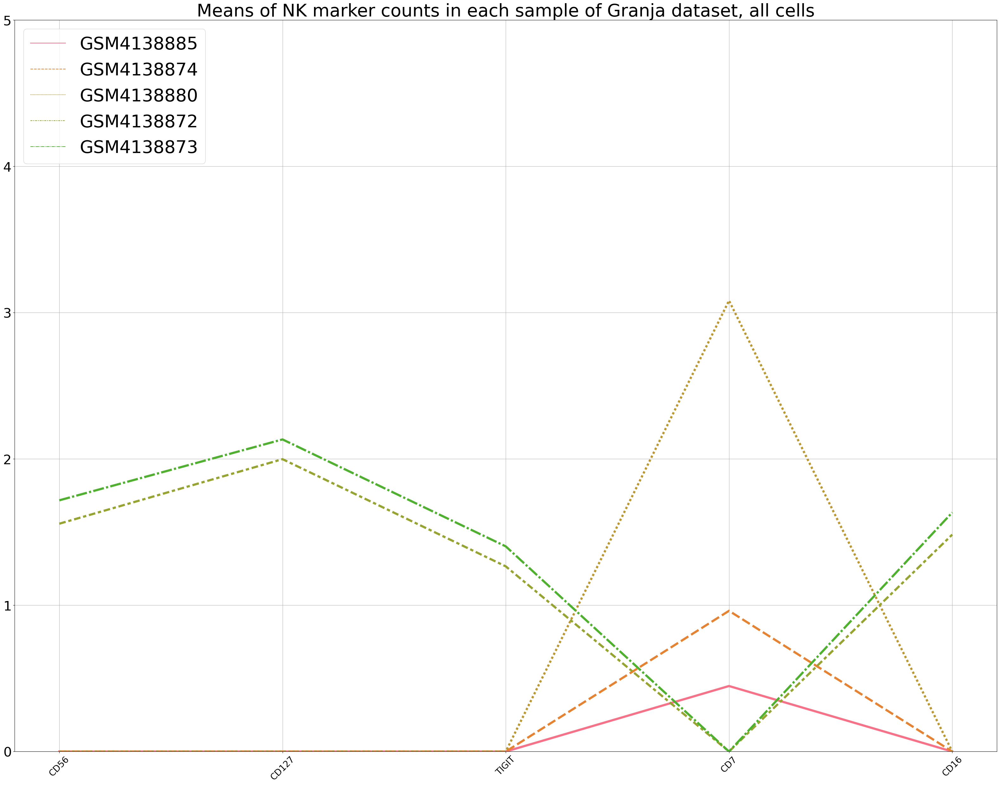

In [114]:
#Only NK cells from each sample selected, CLR normalized

palette = sns.color_palette("husl", 12)

plt.figure(figsize=[40,30])
a= sns.lineplot(data=df_sorted_g_all.loc[nk_granja], palette=palette, linewidth = 5)
a.set_xticklabels(a.get_xticklabels(),rotation=45) 
a.tick_params(axis='x', labelsize=20)
a.tick_params(axis='y', labelsize=30)
plt.ylim(0, 5)
plt.legend(loc='upper left', fontsize = 40, facecolor='white')
plt.grid()
plt.title("Means of NK marker counts in each sample of Granja dataset, all cells", fontsize=40) ;



### Easigenomics

In [118]:
samples_e=adata_easi.obs['POOL'].unique().tolist()

In [119]:
#save means of protein counts/each protein/each sample into a list

list_samples_e= []

for sample in samples_e:
    eg=adata_easi[adata_easi.obs['new_cell_type'] == 'NKT']
    eg=adata_easi[adata_easi.obs['POOL'] == sample]
    prot=eg.obsm['protein_expression_clr']
    prot_mean=prot.mean(axis=0).sort_values()
    list_samples_e.append(prot_mean)

In [120]:
all_cells_easi=[]
nkt_cell_easi=[]

for sample in samples_e:
    all_cells_easi.append(len(adata_easi[adata_easi.obs['POOL'] == sample]))
    nkt_cell_easi.append(len(easi_nkt[easi_nkt.obs['POOL'] == sample]))

print(all_cells_easi)
print(nkt_cell_easi)

[2188, 681, 3980, 5455, 1587, 1734, 35, 2169, 444, 131, 4864, 2064, 1107, 2435, 3763, 3123, 2111, 143, 1611, 1067, 480, 1756, 3736, 1304, 1670, 3199, 6262, 789, 2016, 2488, 1753, 584, 2394, 3125, 845, 2682, 2856, 1771, 2973, 572, 373, 709, 3020, 1323, 1735, 3523, 116, 2981, 1112, 2914, 1497, 2837, 837, 3663, 94, 3753, 1417, 2297, 3192]
[1226, 34, 1057, 538, 0, 57, 0, 1585, 23, 0, 1670, 1913, 26, 187, 809, 508, 131, 37, 887, 12, 51, 1004, 2483, 0, 636, 282, 3688, 142, 454, 1829, 40, 70, 39, 0, 263, 349, 150, 0, 602, 38, 0, 0, 0, 0, 541, 2508, 0, 0, 1011, 0, 0, 72, 0, 176, 49, 103, 0, 362, 96]


In [121]:
#save column names
proteins=adata_easi.obsm['protein_expression_clr'].columns

In [123]:
#creating a dataframe from list of lists

df_e= pd.DataFrame(list_samples_e, columns = proteins)


In [124]:
df_e=df_e.T


In [125]:
#add column names

df_e.columns=samples_e

In [391]:
df_e=df_e.T

In [126]:
#remove columns that contain only zeros

df_e = pd.DataFrame(df_e)
df_e != 0
(df_e != 0).any(axis=0)
df_e.loc[:, (df_e != 0).any(axis=0)]
df_e = df_e.loc[:, (df_e != 0).any(axis=0)]


In [127]:
index_sort = df_e.mean().sort_values().index
df_sorted_e = df_e[index_sort]


In [128]:
df_sorted_e=df_sorted_e.T

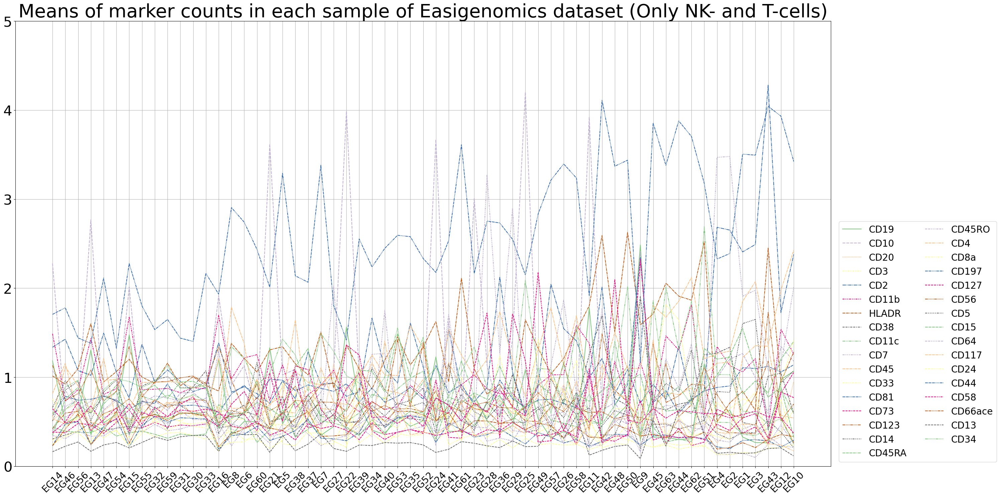

In [129]:
#only NK- and T-cells selected from each sample, CLR normalized

palette = sns.color_palette("Accent")

plt.figure(figsize=[30,15])
ax = sns.lineplot(data=df_sorted_e, palette=palette)
ax.legend(loc=(1.01, 0.01), ncol=2, fontsize = 20, facecolor='white')
ax.tick_params(axis='x', labelsize=20, rotation=45)
ax.tick_params(axis='y', labelsize=30)
plt.grid()
plt.ylim(0, 5)
plt.title("Means of marker counts in each sample of Easigenomics dataset (Only NK- and T-cells)", fontsize=40) ;

plt.tight_layout()

In [130]:
df_sorted_e=df_sorted_e.T

In [136]:
df_sorted_e

,CD19,CD10,CD20,CD3,CD2,CD11b,HLADR,CD38,CD11c,CD7,...,CD5,CD15,CD64,CD117,CD24,CD44,CD58,CD66ace,CD13,CD34
EG14,1.184852,2.277077,0.514161,0.242711,1.336285,1.488085,1.014428,0.306496,0.426445,1.072338,...,0.659229,0.347441,0.345749,0.531341,0.249496,1.705668,0.375742,0.229613,0.163190,0.586247
EG46,0.479148,0.550196,0.638762,0.398954,1.427607,0.729867,0.921759,0.351070,0.637312,0.853840,...,0.961829,0.753896,0.310431,0.476937,0.334928,1.779866,0.496570,0.417764,0.224646,0.891306
EG56,0.562655,0.626202,0.707155,0.372900,1.074846,0.860664,1.095819,0.395127,0.751703,0.629189,...,0.691521,0.884568,0.395162,0.645692,0.399779,1.441199,0.719514,0.587883,0.272657,0.963920
EG13,1.306242,2.767509,0.442405,0.253799,1.021475,1.433807,1.601782,0.489418,0.377444,0.734415,...,0.595674,0.350893,0.336273,0.496039,0.424596,1.381721,0.403091,0.241940,0.168257,0.596926
EG47,0.486688,0.545124,0.620468,0.382249,1.495564,0.807083,0.946917,0.401240,0.699945,0.809204,...,0.792249,0.725302,0.342205,0.457914,0.318575,2.114464,0.520541,0.406656,0.239146,0.860810
EG54,0.584201,0.612560,0.734175,0.393189,1.056324,0.870620,1.062953,0.427984,0.838131,0.724232,...,0.731224,0.911829,0.432536,0.569144,0.410709,1.324535,0.659359,0.617721,0.267622,0.983298
EG15,1.476700,2.013784,0.429390,0.245128,0.767168,1.678677,1.202339,0.447097,0.420661,0.473493,...,0.364007,0.469332,0.515547,0.533451,0.223168,2.276258,0.398000,0.258264,0.205838,0.952396
EG55,0.536673,0.568852,0.671448,0.408414,1.371632,0.861239,1.001360,0.426633,0.784834,0.840918,...,0.738290,0.839704,0.382169,0.503287,0.369188,1.800826,0.604706,0.547271,0.267061,0.885142
EG32,0.585741,0.735700,0.744420,0.327289,0.941792,0.864910,0.931040,0.644314,0.740615,0.542802,...,0.648854,0.909316,0.470097,0.615216,0.525166,1.534240,0.555540,0.580434,0.330433,0.951659
EG59,0.534060,0.625217,0.662745,0.372214,1.082605,0.874006,1.158000,0.419452,0.798810,0.476965,...,0.690145,0.761496,0.398707,0.722942,0.399081,1.648305,0.557206,0.513059,0.290548,1.132224


In [138]:
#Used to check which markers were used in Granja

listOfmarkers= nk_all

nk_easi= []

for x in listOfmarkers:
    if x in df_sorted_e.columns:
        print(x, "Yes")
        nk_easi.append(x)
    else:
        print(x, "No") 



CD5 Yes
CD52 No
CD226 No
CD56 Yes
CD2 Yes
CD27 No
CD158b No
CD127 Yes
CD122 No
CD38 Yes
CD161 No
CD314 No
TIGIT No
CD57 No
CD195 No
CD155 No
CD335 No
CD44 Yes
CD7 Yes
CD69 No
CD94 No
CD16 No
CD62L No


In [139]:
df_sorted_e=df_sorted_e.T

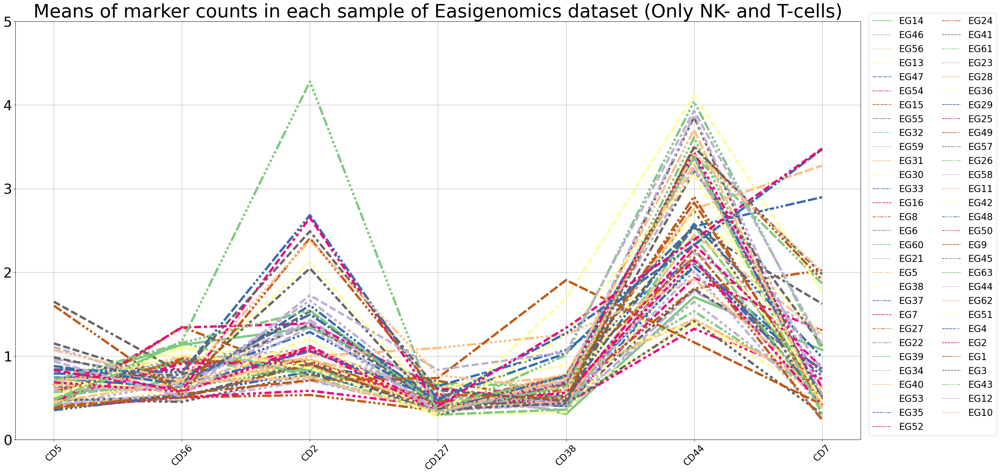

In [140]:
#only NK- and T-cells selected from each sample, CLR normalized

palette = sns.color_palette("Accent")

plt.figure(figsize=[30,15])
ax = sns.lineplot(data=df_sorted_e.loc[nk_easi], palette=palette, linewidth = 5)
ax.legend(loc=(1.01, 0.01), ncol=2, fontsize = 20, facecolor='white')
ax.tick_params(axis='x', labelsize=20, rotation=45)
ax.tick_params(axis='y', labelsize=30)
plt.grid()
plt.ylim(0, 5)
plt.title("Means of marker counts in each sample of Easigenomics dataset (Only NK- and T-cells)", fontsize=40) ;

plt.tight_layout()

In [141]:
samples_easi=adata_easi.obs['POOL'].unique().tolist()

In [142]:
#saving NK markers from all samples into a list

list_easi=[]

for sample in samples_easi:
    eg=adata_easi[adata_easi.obs['new_cell_type'] == 'NKT']
    eg=adata_easi[adata_easi.obs['POOL'] == sample]
    prot=eg.obsm['protein_expression_clr']
    prot_marker=prot[nk_easi]
    list_easi.append(prot_marker)

In [143]:
list_easi[1]

,CD5,CD56,CD2,CD127,CD38,CD44,CD7
AAACGGGGTCTAGCCG-1-101,0.312750,0.777017,0.707101,0.199103,0.257540,2.138944,0.592108
AAAGATGAGGGCTTCC-1-101,0.319962,0.881300,0.881300,0.249051,0.172724,1.950644,0.319962
AAAGATGCATGGGAAC-1-101,0.278052,0.495373,0.588557,0.495373,1.672880,1.912499,0.148659
AAAGCAACAGATAATG-1-101,0.616756,1.178216,0.840760,0.382007,0.270140,1.896149,0.382007
AAATGCCTCAAAGACA-1-101,0.205247,1.115291,0.908615,0.205247,0.107880,2.279459,0.293969
...,...,...,...,...,...,...,...
TTTCCTCTCCCTCAGT-1-101,0.412323,0.968136,0.539093,0.342353,0.477715,2.461021,0.267117
TTTCCTCTCGGCTACG-1-101,0.515171,0.624051,0.674346,0.515171,0.091918,1.792808,0.392970
TTTGCGCGTTAAGGGC-1-101,0.509550,0.724291,0.622673,0.548697,0.286885,2.076649,0.286885
TTTGCGCTCTGTCCGT-1-101,0.486313,0.872046,0.714835,0.130309,0.442581,1.384384,0.442581


In [144]:
pd.concat(list_easi, axis=0)

,CD5,CD56,CD2,CD127,CD38,CD44,CD7
AAACCTGAGCCCTAAT-1-100,0.507486,0.664975,1.800515,0.507486,0.386772,2.054122,1.667181
AAACCTGCAAGCCGCT-1-100,0.625459,0.433851,1.530668,0.457046,0.924628,1.905325,0.385782
AAACCTGCACTGTCGG-1-100,0.611467,0.628908,0.938660,0.439080,0.803020,3.010364,0.439080
AAACCTGCAGACGCTC-1-100,1.135601,0.560815,1.879650,0.223703,0.453003,2.121294,2.364060
AAACCTGTCCTTAATC-1-100,1.088464,0.800025,1.853775,0.422162,0.332136,2.193482,1.225956
...,...,...,...,...,...,...,...
TTTGTCAGTACATCCA-1-158,0.299771,0.673588,0.530098,0.530098,0.945062,1.262496,0.421551
TTTGTCAGTAGGCATG-1-158,0.288542,0.607699,0.775042,0.460800,0.775042,1.578263,0.154642
TTTGTCAGTATGCTTG-1-158,0.473907,0.712605,0.526422,0.418479,0.669208,1.865058,0.297459
TTTGTCATCAAACCAC-1-158,0.410555,0.184869,0.700772,0.410555,0.265890,1.537965,0.410555


In [145]:
# List of lists
# Retrieve protein expression of each sample
# Save it in df with sample information in one column
new_list=[]

for i in range(len(list_easi)):
    sample= list_easi[i]
    sample["Sample"]=samples_easi[i]
    new_list.append(sample)
    

In [146]:
df_new=pd.concat(new_list, axis=0)

In [147]:
df_new


,CD5,CD56,CD2,CD127,CD38,CD44,CD7,Sample
AAACCTGAGCCCTAAT-1-100,0.507486,0.664975,1.800515,0.507486,0.386772,2.054122,1.667181,EG35
AAACCTGCAAGCCGCT-1-100,0.625459,0.433851,1.530668,0.457046,0.924628,1.905325,0.385782,EG35
AAACCTGCACTGTCGG-1-100,0.611467,0.628908,0.938660,0.439080,0.803020,3.010364,0.439080,EG35
AAACCTGCAGACGCTC-1-100,1.135601,0.560815,1.879650,0.223703,0.453003,2.121294,2.364060,EG35
AAACCTGTCCTTAATC-1-100,1.088464,0.800025,1.853775,0.422162,0.332136,2.193482,1.225956,EG35
...,...,...,...,...,...,...,...,...
TTTGTCAGTACATCCA-1-158,0.299771,0.673588,0.530098,0.530098,0.945062,1.262496,0.421551,EG25
TTTGTCAGTAGGCATG-1-158,0.288542,0.607699,0.775042,0.460800,0.775042,1.578263,0.154642,EG25
TTTGTCAGTATGCTTG-1-158,0.473907,0.712605,0.526422,0.418479,0.669208,1.865058,0.297459,EG25
TTTGTCATCAAACCAC-1-158,0.410555,0.184869,0.700772,0.410555,0.265890,1.537965,0.410555,EG25


In [148]:
nk_easi = ['CD2', 'CD56', 'CD127', 'CD38', 'CD5', 'CD7']

In [149]:
df_new = df_new.T.drop_duplicates().T

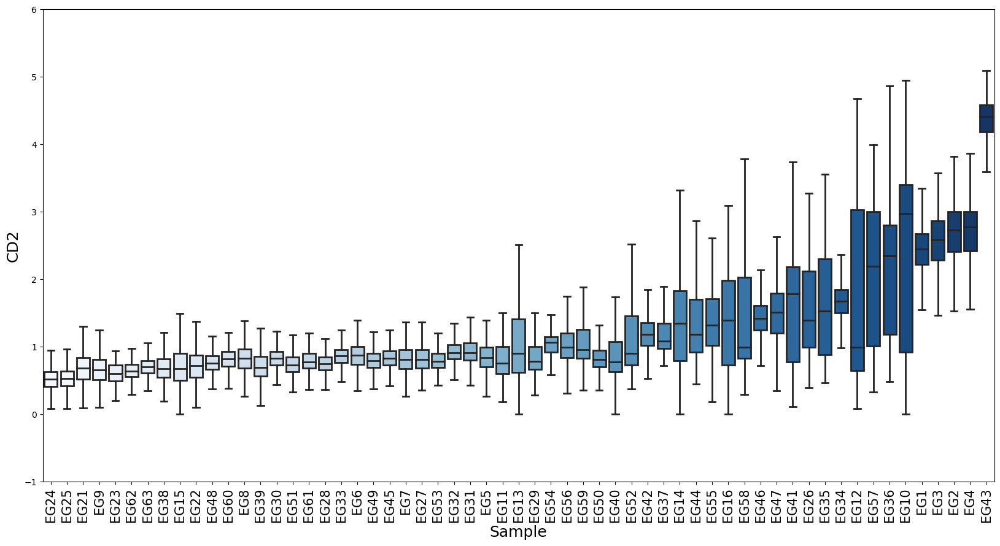

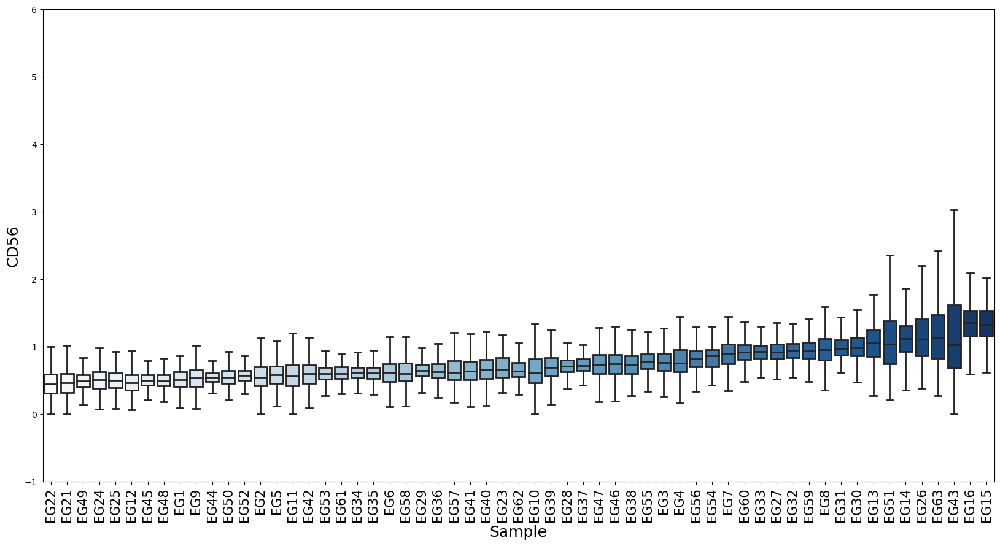

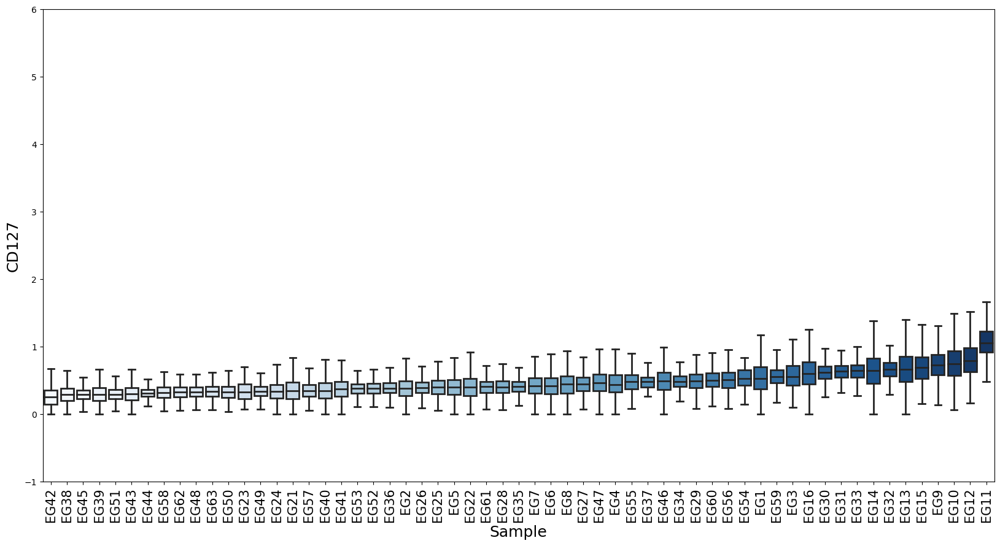

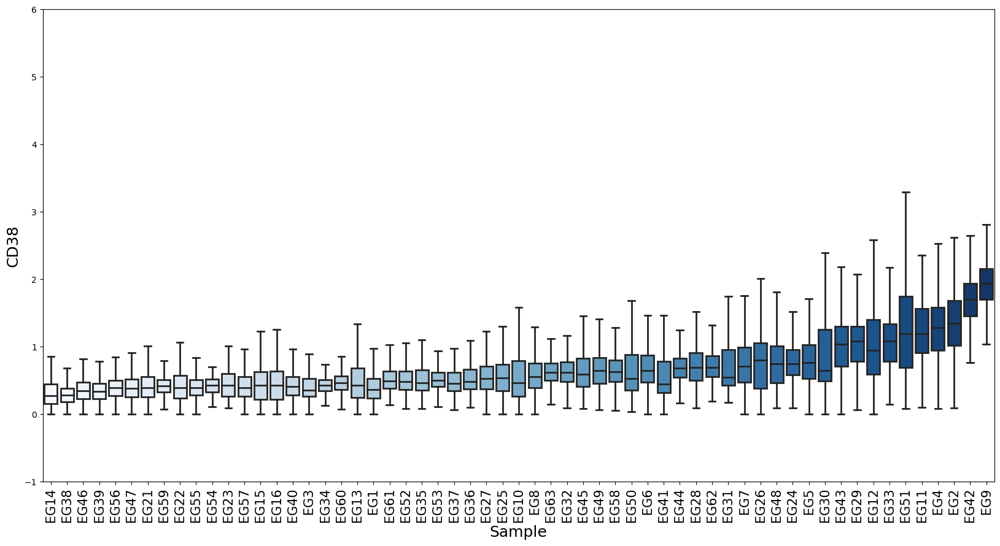

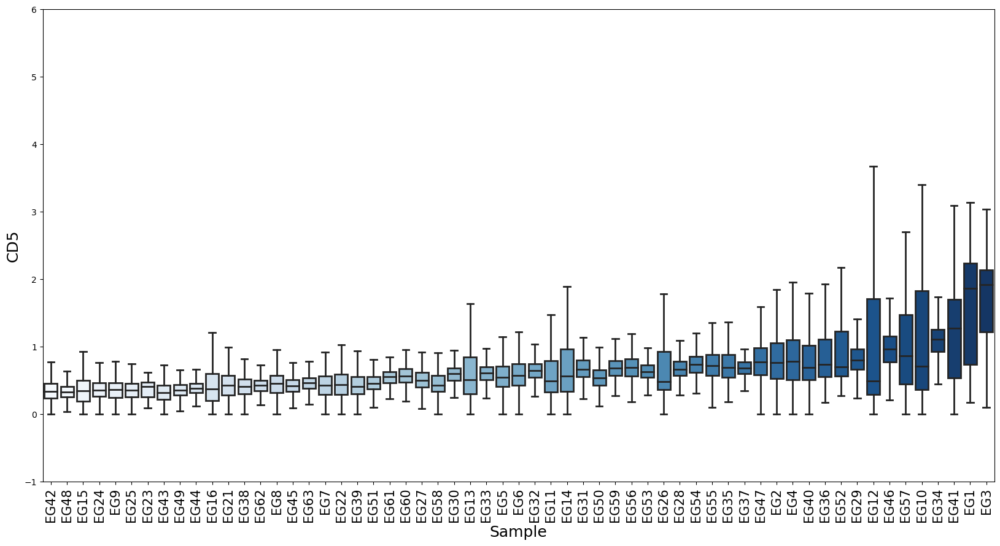

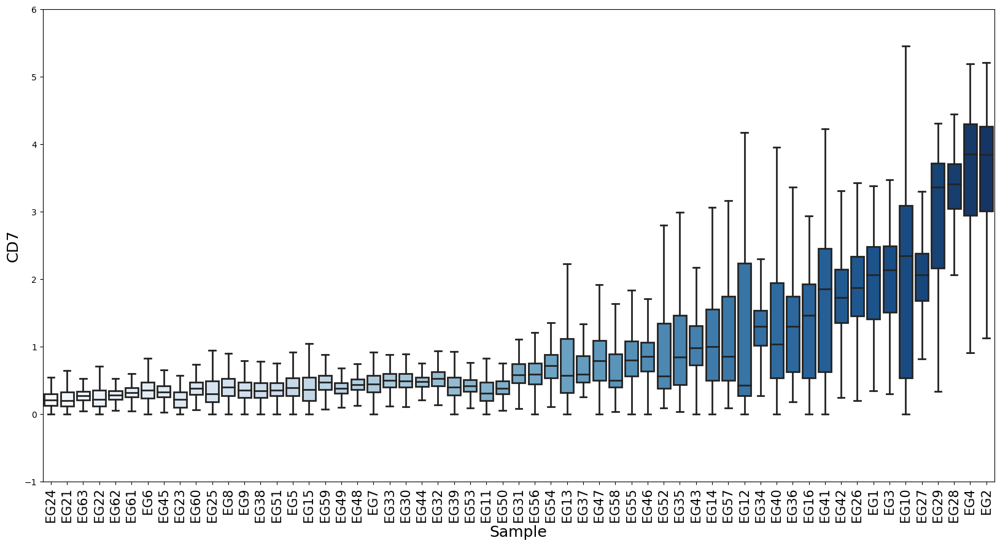

In [150]:
# All markers

for marker in nk_easi:
    plt.figure(figsize=[20,10])
    plt.ylim(-1, 6)
    by_counts = df_new.groupby(['Sample'])[marker].mean().sort_values(ascending=True)
    b=sns.boxplot(data=df_new,x="Sample", y=marker, order=by_counts.index, fliersize=0, palette="Blues", linewidth=2)
    b.set_xticklabels(b.get_xticklabels(),rotation=90) 
    b.tick_params(axis='x', labelsize=15)
    plt.xlabel('Sample', fontsize=18)
    plt.ylabel(marker, fontsize=18);

### Seurat

In [151]:
samples_s=adata_seurat.obs['POOL'].unique().tolist()
samples_s

['Seurat']

In [152]:
#save means of protein counts/each protein/each sample into a list

list_samples_s= []

for sample in samples_s:
    eg=adata_seurat[adata_seurat.obs['new_cell_type'] == 'NK']
    eg=adata_seurat[adata_seurat.obs['POOL'] == sample]
    prot=eg.obsm['protein_expression_clr_seurat']
    prot_mean=prot.mean(axis=0).sort_values()
    list_samples_s.append(prot_mean)


In [154]:
#save column names
proteins=adata_seurat.obsm['protein_expression_clr_seurat'].columns

In [155]:
all_cells_seurat=[]
nk_cell_seurat=[]

for sample in samples_s:
    all_cells_seurat.append(len(adata_seurat[adata_seurat.obs['POOL'] == sample]))
    nk_cell_seurat.append(len(seurat_nk[seurat_nk.obs['POOL'] == sample]))

print(all_cells_seurat)
print(nk_cell_seurat)

[29556]
[1355]


In [156]:
#creating a dataframe from list of lists

df_s= pd.DataFrame(list_samples_s, columns = proteins)

df_s


,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15,CD117,CD66ace
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.700643,0.742467,0.0,0.0,0.0,0.0,0.0


In [157]:
df_s=df_s.T

df_s


,0
CD86,0.0
CD274,0.0
CD270,0.0
CD155,0.0
CD112,0.0
...,...
CD10,0.0
CD90,0.0
CD15,0.0
CD117,0.0


In [158]:
#add column names

df_s.columns=samples_s


In [159]:
df_s=df_s.T

In [160]:
#remove columns that contain only zeros

df_s = pd.DataFrame(df_s)
df_s != 0
(df_s != 0).any(axis=0)
df_s.loc[:, (df_s != 0).any(axis=0)]
df_s = df_s.loc[:, (df_s != 0).any(axis=0)]

df_s

,CD3,CD8,CD56,CD19,CD11c,CD45RA,CD123,CD4,CD14,CD16,...,HLA-DR,CD57,CD278,CD11a,CD79b,CD28,CD38,CD127,CD197,CD34
Seurat,0.923868,1.004051,0.685785,0.823472,0.891831,0.851121,0.796022,0.988902,0.892399,0.776954,...,0.823718,0.715582,0.762652,0.793614,0.705012,0.784389,0.857191,0.830743,0.700643,0.742467


In [161]:
#sorting by mean

index_sort = df_s.mean().sort_values().index
df_sorted_s = df_s[index_sort]

df_sorted_s

,CD25,CD56,CD197,CD79b,CD57,CD161,CD34,CD278,CD16,CD69,...,HLA-DR,CD127,CD45RA,CD27,CD38,CD11c,CD14,CD3,CD4,CD8
Seurat,0.671071,0.685785,0.700643,0.705012,0.715582,0.739996,0.742467,0.762652,0.776954,0.784284,...,0.823718,0.830743,0.851121,0.855648,0.857191,0.891831,0.892399,0.923868,0.988902,1.004051


In [166]:
df_sorted_s=df_sorted_s.T

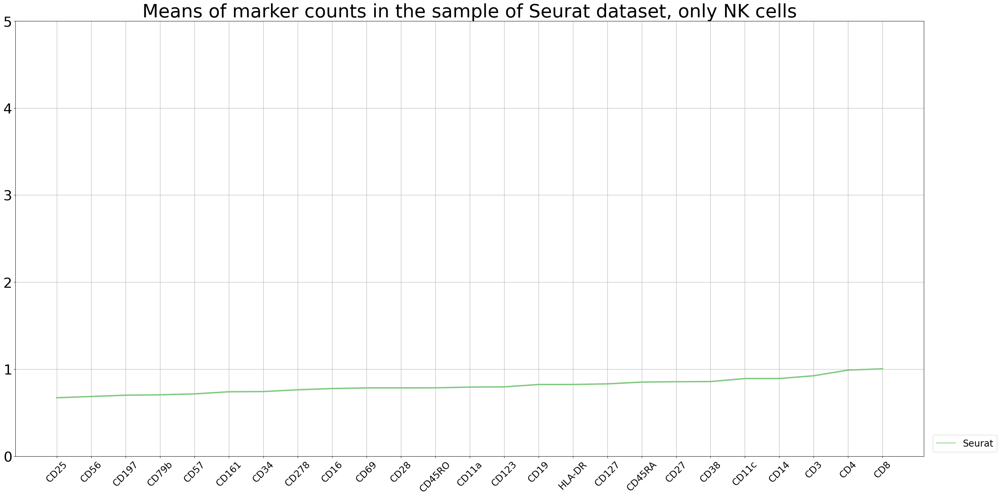

In [167]:
#only NK cells selected from each sample, CLR normalized

palette = sns.color_palette("Accent")

plt.figure(figsize=[30,15])
ax = sns.lineplot(data=df_sorted_s, palette=palette, linewidth = 3)
ax.legend(loc=(1.01, 0.01), ncol=2, fontsize = 20, facecolor='white')
ax.tick_params(axis='x', labelsize=20, rotation=45)
ax.tick_params(axis='y', labelsize=30)
plt.grid()
plt.ylim(0, 5)
plt.title("Means of marker counts in the sample of Seurat dataset, only NK cells", fontsize=40) ;

plt.tight_layout()


In [169]:
df_sorted_s=df_sorted_s.T

In [170]:
#Used to check which markers were used in Granja

listOfmarkers= nk_all

nk_seurat= []

for x in listOfmarkers:
    if x in df_sorted_s.columns:
        print(x, "Yes")
        nk_seurat.append(x)
    else:
        print(x, "No") 
        
print(nk_seurat)



CD5 No
CD52 No
CD226 No
CD56 Yes
CD2 No
CD27 Yes
CD158b No
CD127 Yes
CD122 No
CD38 Yes
CD161 Yes
CD314 No
TIGIT No
CD57 Yes
CD195 No
CD155 No
CD335 No
CD44 No
CD7 No
CD69 Yes
CD94 No
CD16 Yes
CD62L No
['CD56', 'CD27', 'CD127', 'CD38', 'CD161', 'CD57', 'CD69', 'CD16']


In [171]:
df_sorted_s=df_sorted_s.T

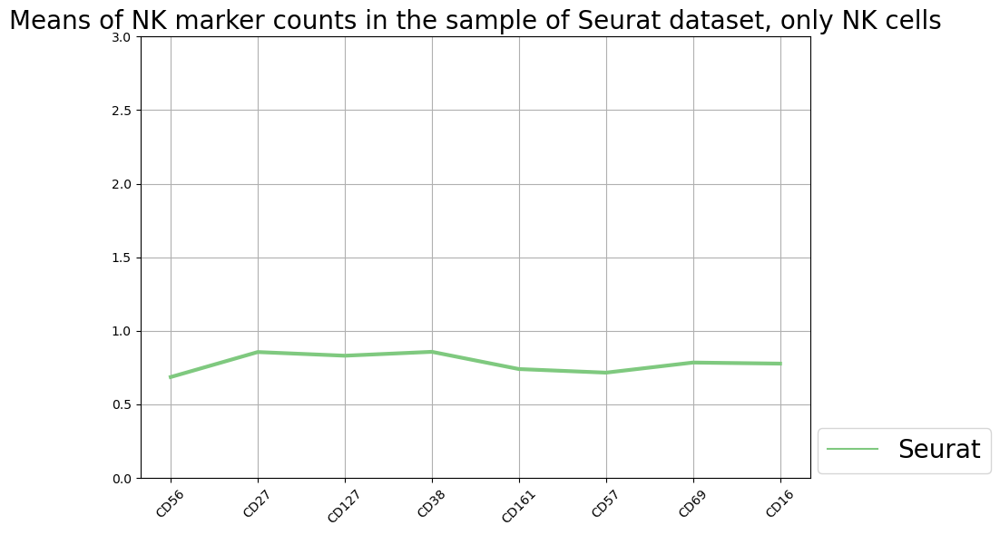

In [172]:
#only NK cells selected from each sample, CLR normalized

palette = sns.color_palette("Accent")

plt.figure(figsize=[10,6])
ax = sns.lineplot(data=df_sorted_s.loc[nk_seurat], palette=palette, linewidth = 3)
ax.legend(loc=(1.01, 0.01), ncol=2, fontsize = 20, facecolor='white')
ax.tick_params(axis='x', labelsize=10, rotation=45)
ax.tick_params(axis='y', labelsize=10)
plt.grid()
plt.ylim(0, 3)
plt.title("Means of NK marker counts in the sample of Seurat dataset, only NK cells", fontsize=20) ;

plt.tight_layout()

In [173]:
by_counts = df_all.groupby(['Sample'])[marker].mean().sort_values(ascending=True)

In [176]:
df_sorted_s

,Seurat
CD25,0.671071
CD56,0.685785
CD197,0.700643
CD79b,0.705012
CD57,0.715582
CD161,0.739996
CD34,0.742467
CD278,0.762652
CD16,0.776954
CD69,0.784284


In [177]:
nk_seurat

['CD56', 'CD27', 'CD127', 'CD38', 'CD161', 'CD57', 'CD69', 'CD16']

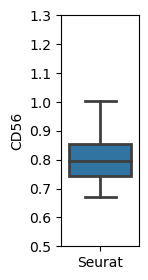

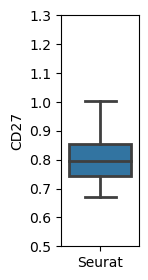

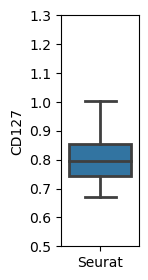

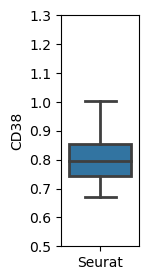

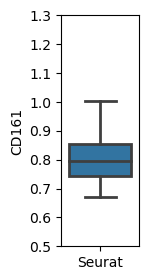

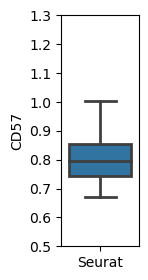

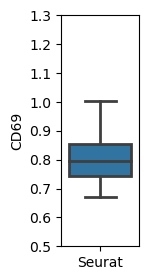

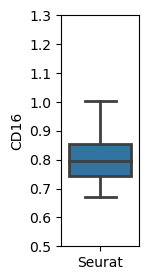

In [180]:
# All markers

for marker in nk_seurat:
    plt.figure(figsize=[1,3])
    plt.ylim(0.5, 1.3)
    ax=sns.boxplot(data=df_sorted_s, linewidth=2) 
    ax.tick_params(axis='x', labelsize=10)
    plt.ylabel(marker, fontsize=10);
    
    


## Number of cells per sample

In [181]:
df_easi_all= pd.DataFrame(all_cells_easi)

In [182]:
df_easi_all=df_easi_all.T

In [183]:
df_easi_all.columns=samples_e

In [184]:
df_easi_all

,EG35,EG38,EG58,EG39,EG4,EG48,EG23,EG36,EG61,EG3,...,EG30,EG60,EG44,EG27,EG22,EG54,EG45,EG5,EG50,EG25
0,2188,681,3980,5455,1587,1734,35,2169,444,131,...,2914,1497,2837,837,3663,94,3753,1417,2297,3192


In [185]:
df_easi_nkt= pd.DataFrame(nkt_cell_easi)

In [186]:
df_easi_nkt=df_easi_nkt.T

In [187]:
df_easi_nkt.columns=samples_e

In [188]:
df_easi_nkt

,EG35,EG38,EG58,EG39,EG4,EG48,EG23,EG36,EG61,EG3,...,EG30,EG60,EG44,EG27,EG22,EG54,EG45,EG5,EG50,EG25
0,1226,34,1057,538,0,57,0,1585,23,0,...,0,0,72,0,176,49,103,0,362,96


In [189]:
df_easi=pd.concat([df_easi_all, df_easi_nkt])

In [190]:
df_easi.index = ['All cells', 'NK cells']

In [191]:
df_easi=df_easi.T

In [192]:
df_easi["Sample"]=samples_e

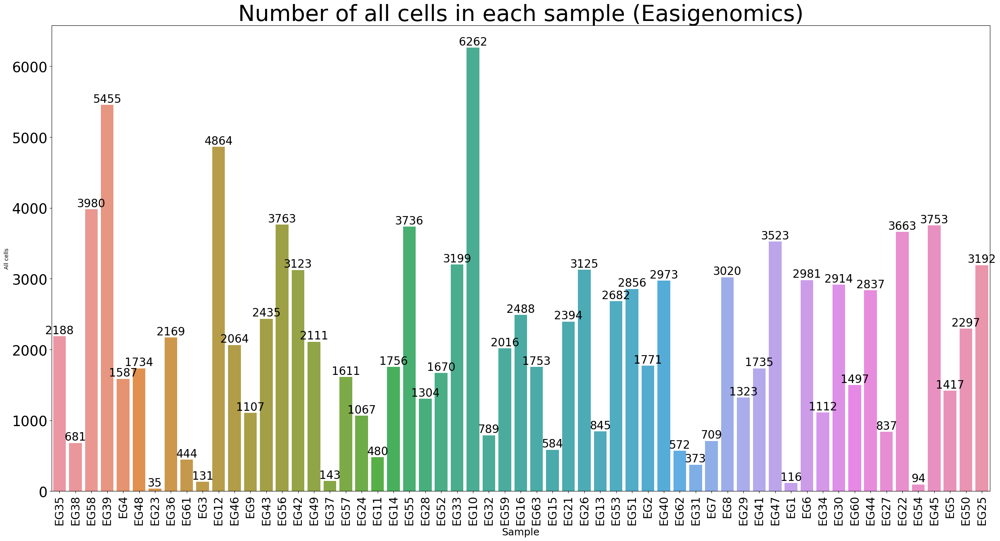

In [208]:
plt.figure(figsize=[30,15])

ax = sns.barplot(data=df_easi, x="Sample", y="All cells")
ax.tick_params(axis='x', labelsize=20, rotation=90)
plt.title("Number of all cells in each sample (Easigenomics)", fontsize=40) ;
ax.tick_params(axis='y', labelsize=25)
plt.xlabel('Sample', fontsize=18)
ax.bar_label(ax.containers[0],fontsize=20) ;



Text(0.5, 0, 'Sample')

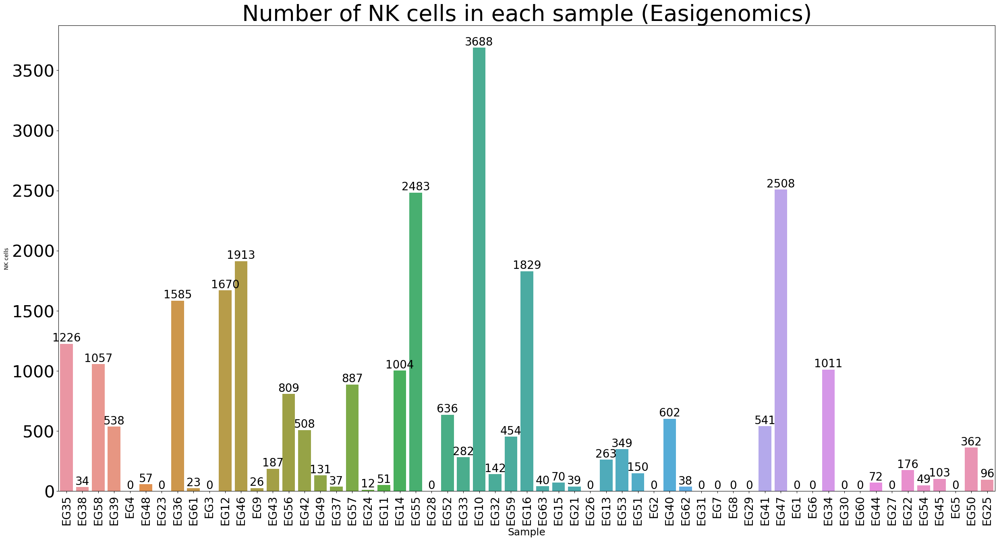

In [209]:
plt.figure(figsize=[30,15])

ax = sns.barplot(data=df_easi, x="Sample", y="NK cells")
ax.tick_params(axis='x', labelsize=20, rotation=90)
plt.title("Number of NK cells in each sample (Easigenomics)", fontsize=40) ;
ax.tick_params(axis='y', labelsize=30)
ax.bar_label(ax.containers[0],fontsize=20) ;
plt.xlabel('Sample', fontsize=18)


In [195]:
df_neurips_all= pd.DataFrame(all_cells_neurips)

df_neurips_all=df_neurips_all.T

df_neurips_all.columns=samples

df_neurips_nk= pd.DataFrame(nk_cell_neurips)

df_neurips_nk=df_neurips_nk.T

df_neurips_nk.columns=samples

df_neurips_nk

df_neurips=pd.concat([df_neurips_all, df_neurips_nk])

In [196]:
df_neurips.index = ['All cells', 'NK cells']

df_neurips=df_neurips.T

df_neurips["Sample"]=samples


Text(0.5, 0, 'Sample')

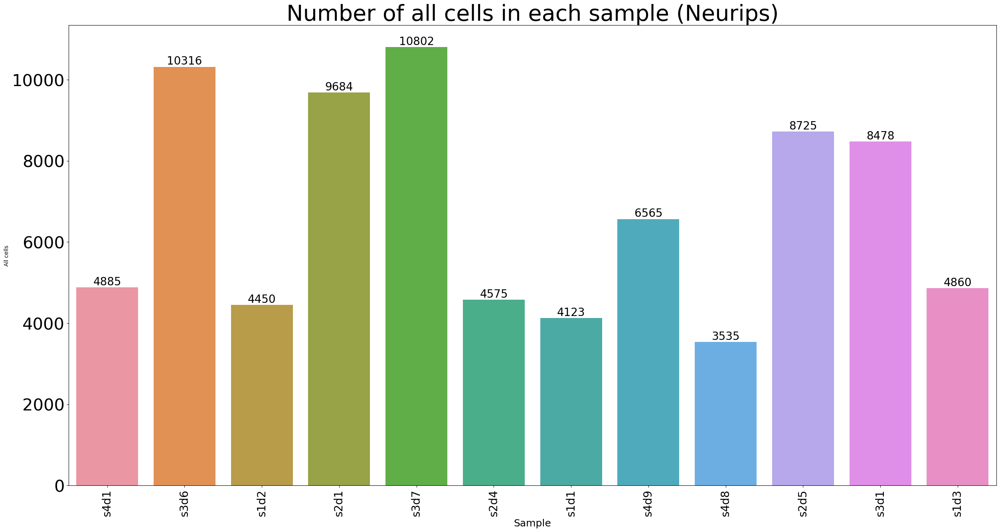

In [210]:
plt.figure(figsize=[30,15])

ax = sns.barplot(data=df_neurips, x="Sample", y="All cells")
ax.tick_params(axis='x', labelsize=20, rotation=90)
plt.title("Number of all cells in each sample (Neurips)", fontsize=40) ;
ax.tick_params(axis='y', labelsize=30)
ax.bar_label(ax.containers[0],fontsize=20) ;
plt.xlabel('Sample', fontsize=18)



Text(0.5, 0, 'Sample')

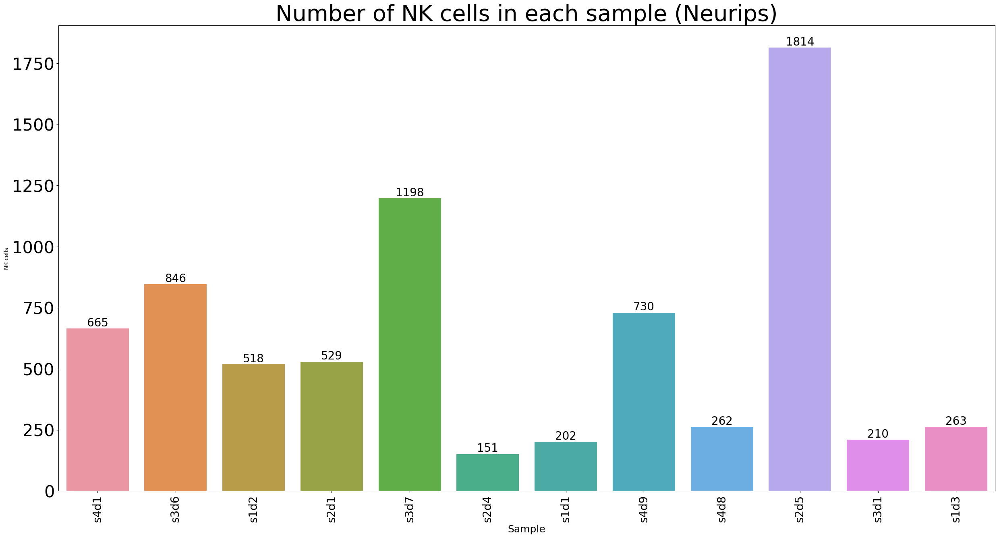

In [211]:
plt.figure(figsize=[30,15])

ax = sns.barplot(data=df_neurips, x="Sample", y="NK cells")
ax.tick_params(axis='x', labelsize=20, rotation=90)
plt.title("Number of NK cells in each sample (Neurips)", fontsize=40) ;
ax.tick_params(axis='y', labelsize=30)
ax.bar_label(ax.containers[0],fontsize=20) ;
plt.xlabel('Sample', fontsize=18)

In [199]:
df_granja_all= pd.DataFrame(all_cells_granja)

df_granja_all=df_granja_all.T

df_granja_all.columns=samples_g

df_granja_nk= pd.DataFrame(nk_cell_granja)

df_granja_nk=df_granja_nk.T

df_granja_nk.columns=samples_g

df_granja_nk

df_granja=pd.concat([df_granja_all, df_granja_nk])

In [200]:
df_granja.index = ['All cells', 'NK cells']

df_granja=df_granja.T

df_granja["Sample"]=samples_g


Text(0.5, 0, 'Sample')

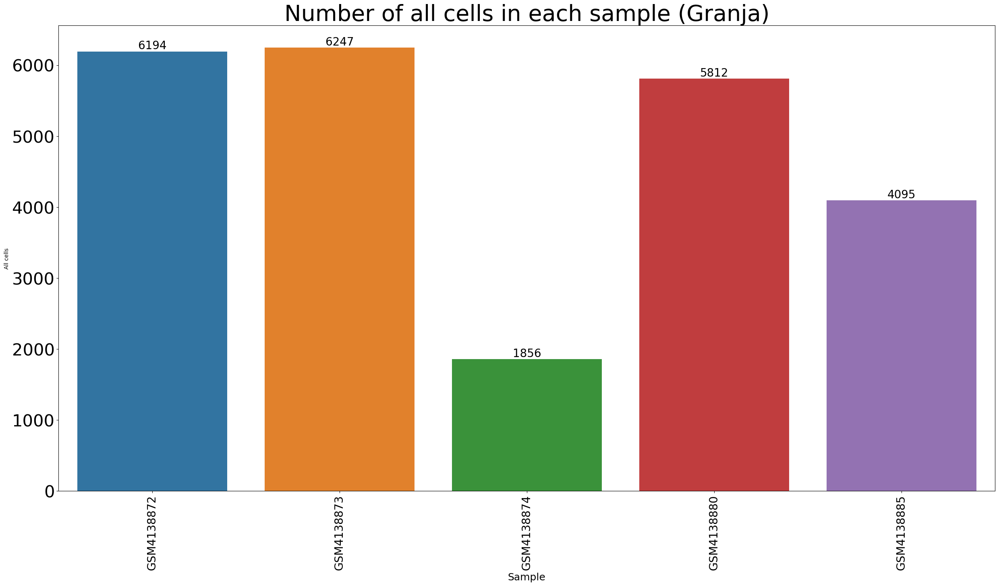

In [212]:
plt.figure(figsize=[30,15])

ax = sns.barplot(data=df_granja, x="Sample", y="All cells")
ax.tick_params(axis='x', labelsize=20, rotation=90)
plt.title("Number of all cells in each sample (Granja)", fontsize=40) ;
ax.tick_params(axis='y', labelsize=30)
ax.bar_label(ax.containers[0],fontsize=20) ;
plt.xlabel('Sample', fontsize=18)



Text(0.5, 0, 'Sample')

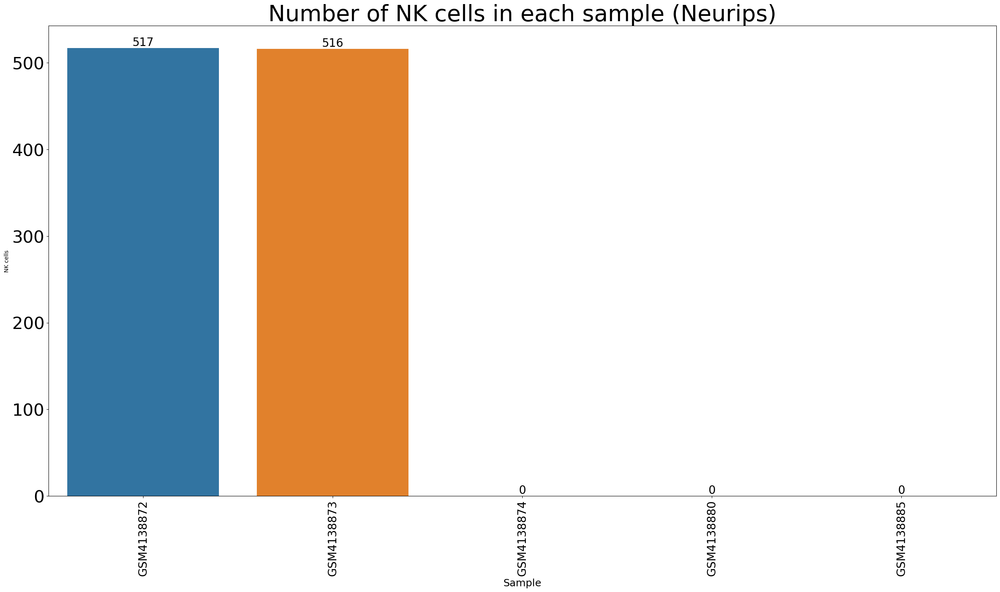

In [213]:
plt.figure(figsize=[30,15])

ax = sns.barplot(data=df_granja, x="Sample", y="NK cells")
ax.tick_params(axis='x', labelsize=20, rotation=90)
plt.title("Number of NK cells in each sample (Neurips)", fontsize=40) ;
ax.tick_params(axis='y', labelsize=30)
ax.bar_label(ax.containers[0],fontsize=20) ;
plt.xlabel('Sample', fontsize=18)

In [203]:
df_seurat_all= pd.DataFrame(all_cells_seurat)

df_seurat_all=df_seurat_all.T

df_seurat_all.columns=samples_s

df_seurat_nk= pd.DataFrame(nk_cell_seurat)

df_seurat_nk=df_seurat_nk.T

df_seurat_nk.columns=samples_s

df_seurat_nk


,Seurat
0,1355


In [204]:
df_seurat=pd.concat([df_seurat_all, df_seurat_nk])

df_seurat.index = ['All cells', 'NK cells']

df_seurat=df_seurat.T

df_seurat["Sample"]=samples_s

df_seurat

,All cells,NK cells,Sample
Seurat,29556,1355,Seurat


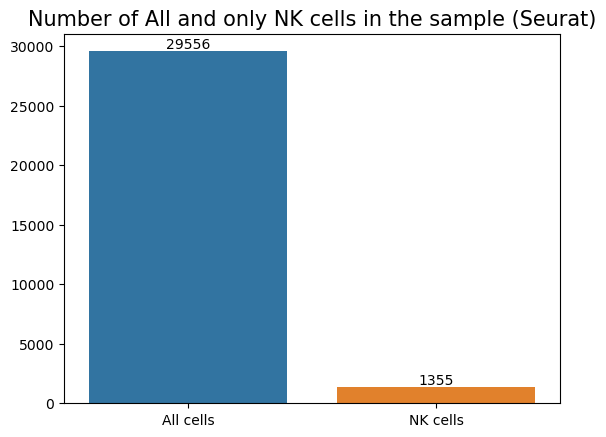

In [205]:
ax = sns.barplot(data=df_seurat)
ax.bar_label(ax.containers[0],fontsize=10)
plt.title("Number of All and only NK cells in the sample (Seurat)", fontsize=15) ;

In [215]:
thedf = pd.concat([df_easi, df_neurips, df_seurat, df_granja])

In [242]:
data5 = df_easi.assign(Dataset= "Easigenomics")  

In [243]:
data6 = df_neurips.assign(Dataset = "Neurips")

In [244]:
data7 = df_seurat.assign(Dataset = "Seurat")

In [249]:
data8 = df_granja.assign(Dataset = "Granja")

In [250]:
thedf = pd.concat([data5, data6, data7, data8])

In [251]:
thedf

,All cells,NK cells,Sample,Dataset
EG35,2188,1226,EG35,Easigenomics
EG38,681,34,EG38,Easigenomics
EG58,3980,1057,EG58,Easigenomics
EG39,5455,538,EG39,Easigenomics
EG4,1587,0,EG4,Easigenomics
...,...,...,...,...
GSM4138872,6194,517,GSM4138872,Granja
GSM4138873,6247,516,GSM4138873,Granja
GSM4138874,1856,0,GSM4138874,Granja
GSM4138880,5812,0,GSM4138880,Granja


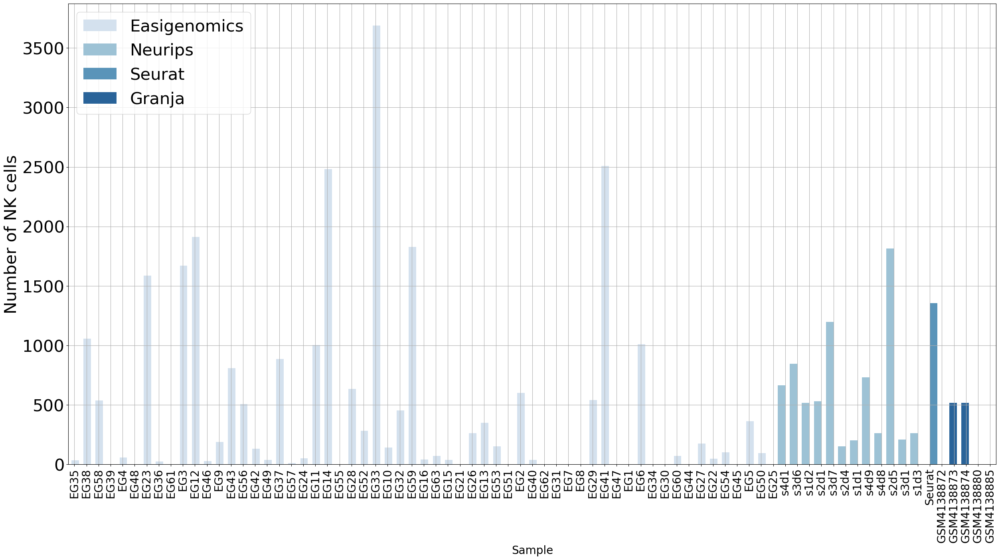

In [290]:
plt.figure(figsize=[30,15])

ax = sns.barplot(data=thedf, x="Sample", y="NK cells", width=2.5, palette = "Blues", hue = "Dataset")
ax.tick_params(axis='x', labelsize=20, rotation=90)
ax.tick_params(axis='y', labelsize=30)
plt.xlabel('Sample', fontsize=20)
plt.ylabel('Number of NK cells', fontsize=30)
plt.legend(loc = 'upper left',  fontsize=30)
#ax.bar_label(ax.containers[0],fontsize=20) ;
plt.grid()
#sns.move_legend(ax, "upper left", title='Dataset')



- here NK cells (but Easigenomics NKT) from each dataset are selected based on cell type annotations made by authors, and cell numbers visualized. 

In [268]:
thedf

,All cells,NK cells,Sample,Dataset
EG35,2188,1226,EG35,Easigenomics
EG38,681,34,EG38,Easigenomics
EG58,3980,1057,EG58,Easigenomics
EG39,5455,538,EG39,Easigenomics
EG4,1587,0,EG4,Easigenomics
...,...,...,...,...
GSM4138872,6194,517,GSM4138872,Granja
GSM4138873,6247,516,GSM4138873,Granja
GSM4138874,1856,0,GSM4138874,Granja
GSM4138880,5812,0,GSM4138880,Granja


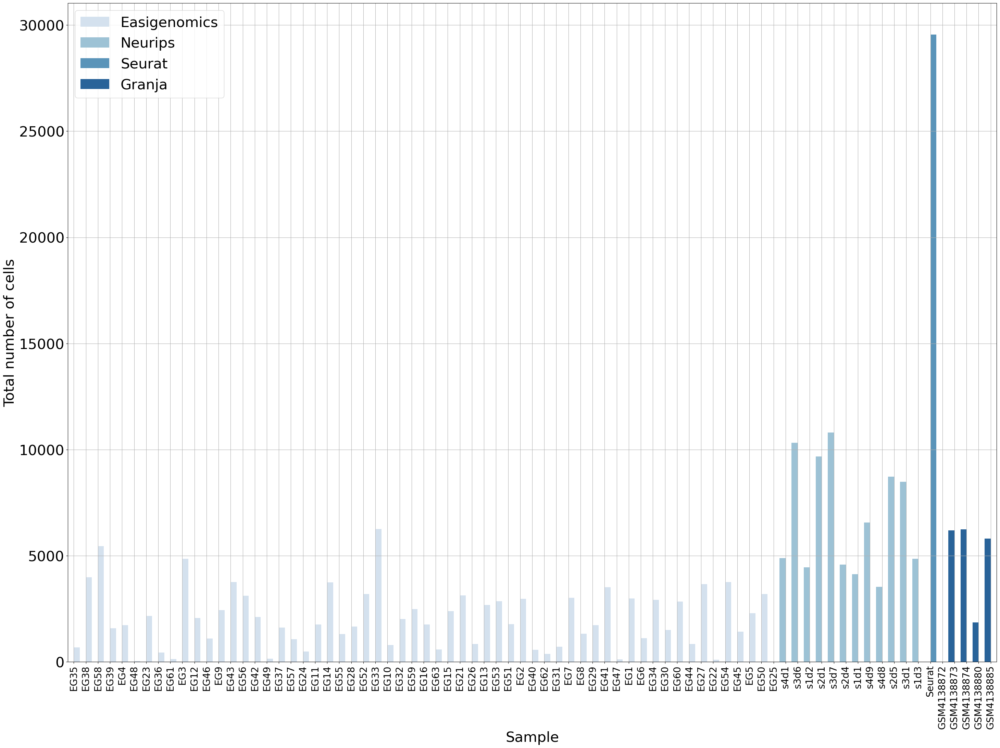

In [292]:
plt.figure(figsize=[35,25])

ax = sns.barplot(data=thedf, x="Sample", y="All cells", width = 2,  palette = "Blues", hue = "Dataset")
ax.tick_params(axis='x', labelsize=20, rotation=90)
#plt.title("All datasets, all cells", fontsize=40) ;
plt.legend(loc = 'upper left',  fontsize=30)
ax.tick_params(axis='y', labelsize=30)
#ax.bar_label(ax.containers[0],fontsize=20, rotation=90) ;
plt.xlabel('Sample', fontsize=30)
plt.ylabel('Total number of cells', fontsize=30)
plt.grid()



